# Regression

---

## Description

---

С 1ого октября отменяется НДС на бриллианты, теперь они становятся новым инвестиционным инструментом. Давайте сделаем модель ценообразования для них.

Скачаем датасет diamonds.csv

В нем представлены характеристики бриллиантов и их цены с сайта jamesallen (B2C площадка) с 2022-07-01

**Описание полей**


* fluor - флуорисценуия (свойство камня светиться в лучах ультр)
* symmetry - показатель симметричности
* platform - название платформы, где был размещен камень
* quality_group - составной показатель из cut polish symmetry
* size_group - каратно весовая группа
* big_size_group - каратно-весовая группа
* shape - форма
* color - цвет
* clarity - чистота
* cut - качество огранки (может быть только у круглых камней)
* polish - полировка
* id - номер камня
* date - дата
* price - цена
* carat - кол-во карат
* tablepercent - размер площадки по отношению ширине
* price_per_carat - цена за карат
* z - длина (diameter)
* x - ширина
* depth_perc - отношение высоты к ширине
* y - высота



In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

pd.options.mode.chained_assignment = None

In [2]:
# from google.colab import drive
# drive.mount('/content/drive')
# 
# path = 'drive/MyDrive/'

## Preprocessing Data

---

In [3]:
df = pd.read_csv("diamonds.csv", index_col=0)
df.head()

,fluor,symmetry,platform,shape,color,clarity,cut,polish,id,date,price,carat,price_per_carat,z,x,depth_perc,y
135269,NONE,EX,jamesallen,PS,F,SI1,NaN,EX,13870838,202206,12850.0,1.55,8290.32,10.29,6.41,62.0,3.97420
48477,MED,EX,jamesallen,RD,H,VVS2,EX,EX,11725253,202207,7510.0,1.02,7362.75,6.41,6.45,62.5,4.03125
236786,NONE,EX,jamesallen,EM,H,IF,NaN,EX,14444347,202205,21220.0,2.01,10557.21,8.60,6.37,65.0,4.14050
235781,NONE,EX,jamesallen,RD,E,VS2,EX,EX,14438434,202207,8660.0,1.00,8660.00,6.39,6.44,61.4,3.95416
277744,NONE,VG,jamesallen,RD,F,VS1,VG,EX,14615276,202206,8480.0,1.00,8480.00,6.28,6.36,62.3,3.96228


Проверим общую информацию о данных:

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 222222 entries, 135269 to 310690
Data columns (total 17 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   fluor            222207 non-null  object 
 1   symmetry         222218 non-null  object 
 2   platform         222218 non-null  object 
 3   shape            222218 non-null  object 
 4   color            222218 non-null  object 
 5   clarity          222218 non-null  object 
 6   cut              148981 non-null  object 
 7   polish           222218 non-null  object 
 8   id               222222 non-null  int64  
 9   date             222222 non-null  int64  
 10  price            222222 non-null  float64
 11  carat            222222 non-null  float64
 12  price_per_carat  222222 non-null  float64
 13  z                222222 non-null  float64
 14  x                222222 non-null  float64
 15  depth_perc       222222 non-null  float64
 16  y                222222 non-null  floa

Кол-во уникальных значений:

In [5]:
df.nunique()

fluor                   4
symmetry                4
platform                1
shape                  10
color                  10
clarity                 9
cut                     3
polish                  3
id                 162278
date                    4
price                8437
carat                 632
price_per_carat     52605
z                    1116
x                     904
depth_perc            318
y                   37650
dtype: int64

У столбца `platform` всего лишь 1 уникальное значение, поэтому для нас он не несет никакой информации. Удалим его:

In [6]:
df.drop(columns=["platform"], inplace=True)

Значения в столбце `depth_perc` являются процентным отношением столбца `x` к `y`, а `price` - произведением столбцов `price_per_carat` и `carat`.
Данная информация, так же, не несет никакой полезной информации. Удалим столбцы:

In [7]:
df.drop(columns=["depth_perc", "price"], inplace=True)

Кол-во пропусков:

In [8]:
df.isnull().sum()

fluor                 15
symmetry               4
shape                  4
color                  4
clarity                4
cut                73241
polish                 4
id                     0
date                   0
carat                  0
price_per_carat        0
z                      0
x                      0
y                      0
dtype: int64

Посмотрим на пропуски и то, что они означают:

**fluor**

1. NONE - None 
2. FNT - Faint (Слабая),
3. MED - Medium (Средняя),
4. STD - Strong (Сильная) 

In [9]:
print(df.fluor.value_counts())
df[df.fluor.isnull()].head(20)

fluor
NONE    142046
FNT      43400
MED      22068
STG      14693
Name: count, dtype: int64


,fluor,symmetry,shape,color,clarity,cut,polish,id,date,carat,price_per_carat,z,x,y
93957,NaN,VG,OV,H,SI2,NaN,VG,13262095,202205,0.97,4298.97,7.75,5.42,3.41460
327809,NaN,EX,RD,G,SI1,EX,EX,14787720,202206,1.29,7790.70,6.97,6.93,4.33125
202754,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0.00,0.00,0.00,0.00,0.00000
244620,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0.00,0.00,0.00,0.00,0.00000
102938,NaN,VG,PS,G,SI2,NaN,VG,13412217,202207,0.96,4822.92,8.60,5.51,3.37763
93960,NaN,VG,OV,D,SI2,NaN,EX,13262100,202205,0.96,5291.67,7.96,5.35,3.31700
94123,NaN,EX,EM,F,SI1,NaN,EX,13264995,202205,1.70,8517.65,7.87,5.60,3.80800
8453,NaN,EX,CUSH,J,VS2,VG,EX,3345704,202206,1.13,3292.04,5.79,5.76,4.29696
102937,NaN,VG,PS,G,SI2,NaN,VG,13412217,202206,0.96,4635.42,8.60,5.51,3.37763
102934,NaN,VG,PS,H,SI2,NaN,VG,13412215,202206,0.98,4295.92,8.09,5.67,3.50973


Видим, что пропуски в столбце `fluor` означают отсутствие флуорисценции. Заменим пропуски на `NONE`:

In [10]:
df.fluor.fillna("NONE", inplace=True)
df.fluor.value_counts()

fluor
NONE    142061
FNT      43400
MED      22068
STG      14693
Name: count, dtype: int64

Заменим значения в столбце `fluor` на числовые:

In [11]:
fluor_dct = {
    "NONE": 1,
    "FNT": 2,
    "MED": 3,
    "STG": 4
}

df.fluor.replace(fluor_dct, inplace=True)
df.fluor.value_counts()

fluor
1    142061
2     43400
3     22068
4     14693
Name: count, dtype: int64

Так же заметим строки с полным отсутствием данных, включая значения `id`. Удалим их:

In [12]:
def print_drop_info(df_: pd.DataFrame, before_: bool = True) -> None:
    print(f"Кол-во строк до удаления: {df_.shape[0]}" if before_ else f"Кол-во строк после удаления: {df_.shape[0]}")

print_drop_info(df)
df = df[~(df.id == 0)]
print_drop_info(df, False)

Кол-во строк до удаления: 222222
Кол-во строк после удаления: 222218


Полагаем, что именно они являлись 4мя пропусками почти во всех столбцах. Проверим:

In [13]:
df.isnull().sum()

fluor                  0
symmetry               0
shape                  0
color                  0
clarity                0
cut                73237
polish                 0
id                     0
date                   0
carat                  0
price_per_carat        0
z                      0
x                      0
y                      0
dtype: int64

Так и есть. Проверим столбец `symmetry`:

**symmetry**

Описание категорий чистоты бриллианта по шкале GIA — Clarity

1. No - None (Нет),
2. G - Good (Хорошо),
3. VG - Very Good (Очень хорошо),
4. EX - Excellent (Отлично)

In [14]:
print(df.symmetry.value_counts())

symmetry
EX    131531
VG     79597
G      11084
No         6
Name: count, dtype: int64


Заменим значения в столбце `symmetry` на числовые:

In [15]:
symmetry_dct = {
    "No": 1,
    "G": 2,
    "VG": 3,
    "EX": 4
}

df.symmetry.replace(symmetry_dct, inplace=True)
df.symmetry.value_counts()

symmetry
4    131531
3     79597
2     11084
1         6
Name: count, dtype: int64

**color**

Описание категорий цвета бриллианта по шкале GIA — Color

1. M - Faint Yellow (Слабо-желтый),
2. L - Very Light Yellow (Очень светло-желтый),
3. K - Light Yellow (Светло-желтый),
4. J - Near Colorless (Почти бесцветный),
5. I - Near Colorless (Почти бесцветный),
6. H - Near Colorless (Почти бесцветный),
7. G - Near Colorless (Почти бесцветный),
8. F - Colorless (Бесцветный),
9. E - Colorless (Бесцветный),
10. D - Colorless (Бесцветный)


In [16]:
df.color.value_counts()

color
G    35446
H    33522
I    29871
F    29506
E    25488
J    24660
D    24402
K    15239
L     2483
M     1601
Name: count, dtype: int64

Заменим значения в столбце `color` на числовые:

In [17]:
color_dct = {
    "M": 1,
    "L": 2,
    "K": 3,
    "J": 4,
    "I": 5,
    "H": 6,
    "G": 7,
    "F": 8,
    "E": 9,
    "D": 10
}

df.color.replace(color_dct, inplace=True)
df.color.value_counts()

color
7     35446
6     33522
5     29871
8     29506
9     25488
4     24660
10    24402
3     15239
2      2483
1      1601
Name: count, dtype: int64

**clarity**

Описание категорий чистоты бриллианта по шкале GIA — Clarity

1. I1 - Included (Включения),
2. SI2 - Slightly Included (Незначительные включения),
3. SI1 - Slightly Included (Незначительные включения),
4. VS2 - Very Slightly Included (Очень незначительные включения),
5. VS1 - Very Slightly Included (Очень незначительные включения),
6. VVS2 - Very Very Slightly Included (Очень-очень незначительные включения),
7. VVS1 - Very Very Slightly Included (Очень-очень незначительные включения),
8. IF - Internally Flawless (Без включений),
9. FL - Flawless (Без включений)

In [18]:
df.clarity.value_counts()

clarity
SI2     48391
SI1     44650
VS2     40139
VS1     36716
VVS2    22716
VVS1    15908
I1       7699
IF       5628
FL        371
Name: count, dtype: int64

Заменим значения в столбце `clarity` на числовые:

In [19]:
clarity_dct = {
    "I1": 1,
    "SI2": 2,
    "SI1": 3,
    "VS2": 4,
    "VS1": 5,
    "VVS2": 6,
    "VVS1": 7,
    "IF": 8,
    "FL": 9
}

df.clarity.replace(clarity_dct, inplace=True)
df.clarity.value_counts()

clarity
2    48391
3    44650
4    40139
5    36716
6    22716
7    15908
1     7699
8     5628
9      371
Name: count, dtype: int64

**cut**

1. NONE - None (Нет),
2. G - Good (Хорошо),
3. VG - Very Good (Очень хорошо),
4. EX - Excellent (Отлично)

In [20]:
print(df.cut.value_counts())
df[df.cut.isnull()].head()

cut
EX    104609
VG     36387
G       7985
Name: count, dtype: int64


,fluor,symmetry,shape,color,clarity,cut,polish,id,date,carat,price_per_carat,z,x,y
135269,1,4,PS,8,3,NaN,EX,13870838,202206,1.55,8290.32,10.29,6.41,3.97420
236786,1,4,EM,6,8,NaN,EX,14444347,202205,2.01,10557.21,8.60,6.37,4.14050
189202,1,4,PS,10,2,NaN,EX,14224443,202205,1.51,6039.74,10.67,6.23,3.67570
76462,1,3,EM,3,2,NaN,VG,12902293,202205,0.91,1527.47,6.30,4.58,3.25180
72397,1,3,PS,4,5,NaN,VG,12771762,202207,2.27,7044.05,11.66,7.26,4.51572


Видим, что пропуски в столбце `cut` означают отсутствие огранки, т.к. камни, скорее всего, не круглые. Заменим пропуски на `NONE`:

In [21]:
df.cut.fillna("NONE", inplace=True)

Заменим значения в столбце `cut` на числовые:

In [22]:
cut_dct = {
    "NONE": 1,
    "G": 2,
    "VG": 3,
    "EX": 4
}

df.cut.replace(cut_dct, inplace=True)
df.cut.value_counts()

cut
4    104609
1     73237
3     36387
2      7985
Name: count, dtype: int64

**polish**

1. G - Good (Хорошо),
2. VG - Very Good (Очень хорошо),
3. EX - Excellent (Отлично)

In [23]:
df.polish.value_counts()

polish
EX    192802
VG     27727
G       1689
Name: count, dtype: int64

Заменим значения в столбце `polish` на числовые:

In [24]:
polish_dct = {
    "G": 1,
    "VG": 2,
    "EX": 3
}

df.polish.replace(polish_dct, inplace=True)
df.polish.value_counts()

polish
3    192802
2     27727
1      1689
Name: count, dtype: int64

**shape**

1. RD - Round (Круглый),
2. EM - Emerald (Изумрудный),
3. OV - Oval (Овальный),
4. CUSH - Cushion (Подушечка),
5. PS - Princess (Принцесса),
6. PR - Pear (Грушевидный),
7. HS - Heart (Сердце),
8. RAD - Radiant (Радиант),
9. EM SQ - Emerald Square (Изумрудный квадрат),
10. MQ - Marquise (Маркиз)

In [25]:
df["shape"].value_counts()

shape
RD       118463
EM        19494
OV        18550
CUSH      16265
PR        14253
PS        12142
HS         9422
RAD        7819
EM SQ      3596
MQ         2214
Name: count, dtype: int64

Категории в данном столбце не являются последовательными, поэтому просто заменить их на числовые значения не получится. Применим метод `get_dummies`:

In [26]:
df = pd.get_dummies(df, columns=["shape"], drop_first=True, dtype=int)
df.head()

,fluor,symmetry,color,clarity,cut,polish,id,date,carat,price_per_carat,...,y,shape_EM,shape_EM SQ,shape_HS,shape_MQ,shape_OV,shape_PR,shape_PS,shape_RAD,shape_RD
135269,1,4,8,3,1,3,13870838,202206,1.55,8290.32,...,3.97420,0,0,0,0,0,0,1,0,0
48477,3,4,6,6,4,3,11725253,202207,1.02,7362.75,...,4.03125,0,0,0,0,0,0,0,0,1
236786,1,4,6,8,1,3,14444347,202205,2.01,10557.21,...,4.14050,1,0,0,0,0,0,0,0,0
235781,1,4,9,4,4,3,14438434,202207,1.00,8660.00,...,3.95416,0,0,0,0,0,0,0,0,1
277744,1,3,8,5,3,3,14615276,202206,1.00,8480.00,...,3.96228,0,0,0,0,0,0,0,0,1


**date**

Сконвертируем столбец `date` в тип `datetime`. Т.к. год не изменяется, и в дальнейшем мы будем работать с месяцем, то оставим только его:

In [27]:
df["dt"] = pd.to_datetime(df.date, format="%Y%m")
df["month"] = df.dt.dt.month.astype(float)
df.drop(columns=["date", "dt"], inplace=True)
df.head()

,fluor,symmetry,color,clarity,cut,polish,id,carat,price_per_carat,z,...,shape_EM,shape_EM SQ,shape_HS,shape_MQ,shape_OV,shape_PR,shape_PS,shape_RAD,shape_RD,month
135269,1,4,8,3,1,3,13870838,1.55,8290.32,10.29,...,0,0,0,0,0,0,1,0,0,6.0
48477,3,4,6,6,4,3,11725253,1.02,7362.75,6.41,...,0,0,0,0,0,0,0,0,1,7.0
236786,1,4,6,8,1,3,14444347,2.01,10557.21,8.60,...,1,0,0,0,0,0,0,0,0,5.0
235781,1,4,9,4,4,3,14438434,1.00,8660.00,6.39,...,0,0,0,0,0,0,0,0,1,7.0
277744,1,3,8,5,3,3,14615276,1.00,8480.00,6.28,...,0,0,0,0,0,0,0,0,1,6.0


Необходимо предсказать `price_per_carat`

In [28]:
df.price_per_carat.describe()

count    222218.000000
mean       7035.035166
std        5216.408361
min        1029.700000
25%        4148.510000
50%        5851.490000
75%        8609.270000
max      955000.000000
Name: price_per_carat, dtype: float64

## Cleaning

---

Не все камни успевают продаться за один месяц, поэтому в таблице есть повторы. Объединим данные по одному камню.

**Попробуем найти аномалии:** вдруг цена на некоторые камни сильно меняется (то есть продавец сам не знает, по какой цене их продавать). Также убедимся, что остальные параметры камня не меняются.

Очистим данные от дубликатов:

In [29]:
print(f"Кол-во строк: {df.shape[0]}")
print(f"Кол-во уникальных камней: {df.id.nunique()}")
print(f"Кол-во строк полных дубликатов: {df.duplicated().sum()}")
print_drop_info(df)
df.drop_duplicates(inplace=True)
df.reset_index(drop=True, inplace=True)
print_drop_info(df, False)

Кол-во строк: 222218
Кол-во уникальных камней: 162277
Кол-во строк полных дубликатов: 2541
Кол-во строк до удаления: 222218
Кол-во строк после удаления: 219677


Посмотрим на статистику:

In [30]:
df.describe(include="all")

,fluor,symmetry,color,clarity,cut,polish,id,carat,price_per_carat,z,...,shape_EM,shape_EM SQ,shape_HS,shape_MQ,shape_OV,shape_PR,shape_PS,shape_RAD,shape_RD,month
count,219677.000000,219677.000000,219677.000000,219677.000000,219677.000000,219677.000000,2.196770e+05,219677.000000,219677.000000,219677.000000,...,219677.000000,219677.000000,219677.000000,219677.000000,219677.000000,219677.000000,219677.000000,219677.000000,219677.000000,219677.000000
mean,1.592356,3.542160,6.566049,3.953696,2.779381,2.860122,1.358852e+07,1.337380,7005.843950,7.074827,...,0.087551,0.015819,0.042326,0.009514,0.083304,0.064003,0.054621,0.034997,0.534202,6.033285
std,0.914919,0.590076,2.171146,1.745321,1.331016,0.368027,2.543922e+06,0.706608,5126.775477,1.359820,...,0.282642,0.124774,0.201332,0.097075,0.276342,0.244759,0.227240,0.183772,0.498830,0.822828
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.942300e+04,0.810000,1029.700000,4.520000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000
25%,1.000000,3.000000,5.000000,2.000000,1.000000,3.000000,1.359866e+07,1.000000,4147.060000,6.260000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000
50%,1.000000,4.000000,7.000000,4.000000,3.000000,3.000000,1.440000e+07,1.010000,5850.000000,6.530000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,6.000000
75%,2.000000,4.000000,8.000000,5.000000,4.000000,3.000000,1.483429e+07,1.500000,8592.590000,7.650000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,7.000000
max,4.000000,4.000000,10.000000,9.000000,4.000000,3.000000,1.541851e+07,21.170000,955000.000000,21.880000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,7.000000


In [31]:
id_stat = df.groupby(by="id")["carat"].count().to_frame()
print(id_stat.value_counts())
id_stat.head()

carat
1        112929
2         41296
3          8052
Name: count, dtype: int64


,carat
id,
19423,3
19449,2
19476,1
19501,3
19504,2


In [32]:
df.loc[:, "duplicates_count"] = df.id.map(id_stat.carat.to_dict())
df_one = df[df.duplicates_count == 1].copy()
df_three = df[df.duplicates_count > 1].copy()

In [33]:
df_one.price_per_carat.describe()

count    112929.000000
mean       7029.128410
std        5329.719913
min        1029.700000
25%        4201.920000
50%        5916.670000
75%        8654.550000
max      955000.000000
Name: price_per_carat, dtype: float64

In [34]:
df_three.price_per_carat.describe()

count    106748.000000
mean       6981.211257
std        4902.849101
min        1195.120000
25%        4084.210000
50%        5780.000000
75%        8531.340000
max      118733.730000
Name: price_per_carat, dtype: float64

Чтобы найти отклонения в данных, сгруппируем данные по `id` и `month`. Для каждого `id` посчитаем разницу между минимальным и максимальным значением каждого параметра:

In [35]:
def print_not_null_dif():
    print("Кол-во строк с отклонениями:")
    for col in df_three_pivot_dif.columns:
        df_diff_ = df_three_pivot_dif[df_three_pivot_dif[col] > 0.0].copy()
        if df_diff_.shape[0] > 0:
            print(col[0], df_diff_.shape[0])

column_lst = [col for col in df_three.columns if col not in ["id", "month", "duplicates_count"]]
df_three_pivot = df_three.pivot_table(index="id", columns="month", values=column_lst, aggfunc="sum")

for col in column_lst:
    p_min = np.nanmin(df_three_pivot[col].values, axis=1)
    p_max = np.nanmax(df_three_pivot[col].values, axis=1)
    df_three_pivot[f"dif_{col}"] = p_max - p_min

df_three_pivot_dif = df_three_pivot.iloc[:, -len(column_lst):]
print_not_null_dif()

Кол-во строк с отклонениями:
dif_fluor 4
dif_symmetry 11
dif_color 9
dif_clarity 10
dif_cut 12
dif_polish 2
dif_carat 11
dif_price_per_carat 43051
dif_z 84
dif_x 82
dif_y 30601


Два самых заметных отклонения в столбцах `price_per_carat` (цена карата) и `y` (высота). Посмотрим на их распределения и попытаемся выяснить возможные причины отклонений:

**Столбец `price_per_carat`**

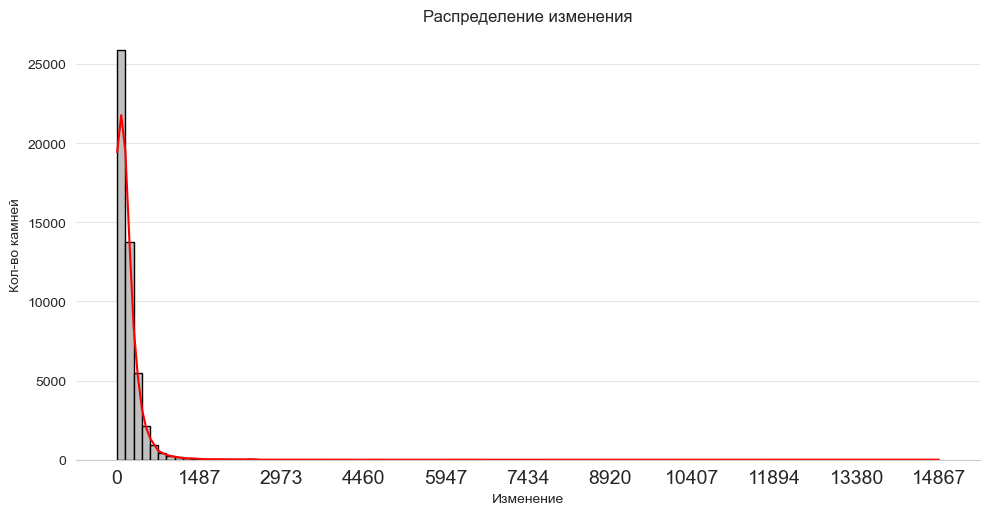

In [36]:
def plot_dist(df_: pd.DataFrame, col_: str) -> None:
    ax = sns.displot(
        df_[col_],
        edgecolor="black",
        linewidth=1,
        color="red",
        facecolor="silver",
        alpha=0.8,
        kde=True,
        aspect=2,
        bins=100
    )

    ax.set(
        xlabel="Изменение",
        ylabel="Кол-во камней",
        title="Распределение изменения",
    )
    sns.despine(left=True)
    plt.grid(axis="y", alpha=0.5)
    plt.grid(axis="x", alpha=0.0)
    plt.xticks(np.histogram(df_[col_])[1], rotation=0, fontsize=14)

    plt.show()

plot_dist(df_three_pivot_dif, "dif_price_per_carat")

In [37]:
df_three_pivot_dif.dif_price_per_carat.describe()

count    49348.000000
mean       196.328878
std        267.862881
min          0.000000
25%         57.690000
50%        140.000000
75%        255.560000
max      14867.200000
Name: dif_price_per_carat, dtype: float64

По скольку 75% значений в столбце `dif_price_per_carat` меньше 256 у.е., то возьмем за границу аномального значения изменения - 370 у.е. за карат.

Кол-во строк до удаления: 49348
Кол-во строк после удаления: 42912


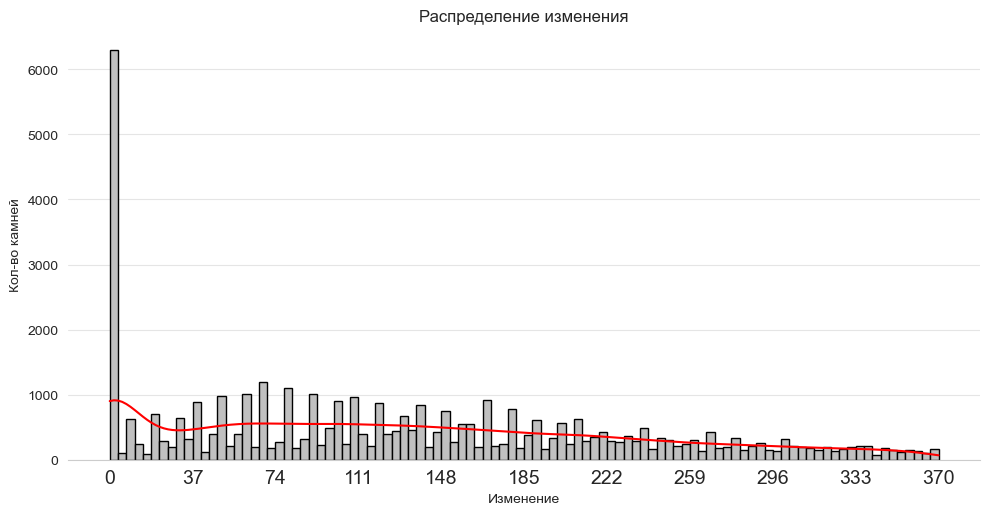


Кол-во строк с отклонениями:
dif_fluor 3
dif_symmetry 6
dif_color 4
dif_clarity 4
dif_cut 8
dif_polish 2
dif_carat 4
dif_price_per_carat 36615
dif_z 73
dif_x 72
dif_y 26658


In [38]:
print_drop_info(df_three_pivot_dif)
df_three_pivot_dif = df_three_pivot_dif[df_three_pivot_dif.dif_price_per_carat < 370.0]
print_drop_info(df_three_pivot_dif, False)

plot_dist(df_three_pivot_dif, "dif_price_per_carat")

print()
print_not_null_dif()

**Столбец `y`**

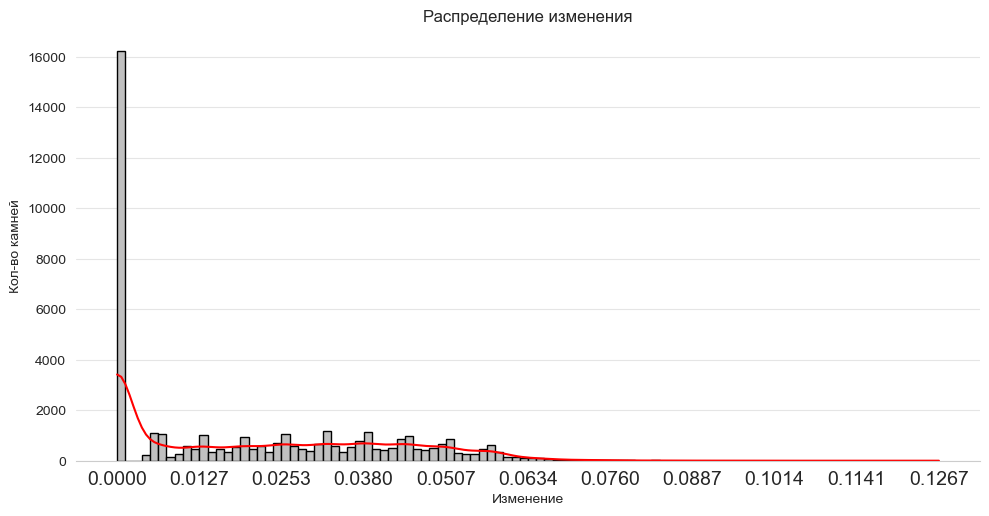

In [39]:
plot_dist(df_three_pivot_dif, "dif_y")

In [40]:
df_three_pivot_dif.dif_y.describe()

count    42912.000000
mean         0.020107
std          0.020469
min          0.000000
25%          0.000000
50%          0.015000
75%          0.037680
max          0.126741
Name: dif_y, dtype: float64

`y` отвечает за высоту камня, то, вероятно, изменение высоты камня может быть связано с полировкой. Так же, мы видим, что на отрезке 0.0 - ~0.0025 отсутствуют значения. При той же полировке, камень может потерять не один карат. Такие камни нам не подходят, поэтому будем считать их выбросами.

In [41]:
print_drop_info(df_three_pivot_dif)
df_three_pivot_dif = df_three_pivot_dif[df_three_pivot_dif.dif_y == 0.0]
print_drop_info(df_three_pivot_dif, False)

print()
print_not_null_dif()

Кол-во строк до удаления: 42912
Кол-во строк после удаления: 16254

Кол-во строк с отклонениями:
dif_symmetry 1
dif_cut 1
dif_price_per_carat 15504


Проверим оставшиеся отклонения:

In [42]:
df_three_pivot_dif[(df_three_pivot_dif.dif_symmetry > 0.0) | (df_three_pivot_dif.dif_cut > 0.0)]

,dif_fluor,dif_symmetry,dif_color,dif_clarity,dif_cut,dif_polish,dif_carat,dif_price_per_carat,dif_z,dif_x,dif_y,dif_shape_EM,dif_shape_EM SQ,dif_shape_HS,dif_shape_MQ,dif_shape_OV,dif_shape_PR,dif_shape_PS,dif_shape_RAD,dif_shape_RD
month,,,,,,,,,,,,,,,,,,,,
id,,,,,,,,,,,,,,,,,,,,
14698741,0.0,1.0,0.0,0.0,0.0,0.0,0.0,128.71,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
14852331,0.0,0.0,0.0,0.0,2.0,0.0,0.0,80.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Данные изменения в параметрах камня не могли произойти без изменения прочих параметров. Поэтому будем считать данные камни выбросами и удалим их:

In [43]:
print_drop_info(df_three_pivot_dif)
df_three_pivot_dif = df_three_pivot_dif[(df_three_pivot_dif.dif_symmetry == 0.0) & (df_three_pivot_dif.dif_cut == 0.0)]
print_drop_info(df_three_pivot_dif, False)

print()
print_not_null_dif()

Кол-во строк до удаления: 16254
Кол-во строк после удаления: 16252

Кол-во строк с отклонениями:
dif_price_per_carat 15502


Удалим аномальные наблюдения:

In [44]:
print_drop_info(df_three)
df_three = df_three.query("id in @df_three_pivot_dif.index").sort_values(by=["id", "month"])
print_drop_info(df_three, False)

df_three = df_three.groupby("id").agg("last").reset_index()
df = pd.concat([df_one, df_three]).reset_index(drop=True)

print("\nКол-во строк:", df.shape[0])
print("Кол-во уникальных id:", df.id.nunique())

df.head()

Кол-во строк до удаления: 106748
Кол-во строк после удаления: 33056

Кол-во строк: 129181
Кол-во уникальных id: 129181


,fluor,symmetry,color,clarity,cut,polish,id,carat,price_per_carat,z,...,shape_EM SQ,shape_HS,shape_MQ,shape_OV,shape_PR,shape_PS,shape_RAD,shape_RD,month,duplicates_count
0,1,4,10,2,1,3,14224443,1.51,6039.74,10.67,...,0,0,0,0,0,1,0,0,5.0,1
1,1,3,3,2,1,2,12902293,0.91,1527.47,6.30,...,0,0,0,0,0,0,0,0,5.0,1
2,1,3,4,5,1,2,12771762,2.27,7044.05,11.66,...,0,0,0,0,0,1,0,0,7.0,1
3,3,4,4,2,4,3,14584509,1.01,3663.37,6.37,...,0,0,0,0,0,0,0,1,5.0,1
4,1,4,7,3,4,3,14773748,1.00,7170.00,6.30,...,0,0,0,0,0,0,0,1,6.0,1


Цены на бриллианты достаточно сильно меняются, попробуем вычислить коэффициент инфляции и привести цены к последнему месяцу. Стоит учитывать, что цены на все бриллианты не изменяются синхронно, то есть изменение в определенных группах может быть разным.

Определим эти группы и рассчитаем коэффициенты инфляции для каждой из них. Подправим цены на эти коэффициенты и создадим новую переменную:

In [45]:
df.corr()["price_per_carat"].sort_values(ascending=False)

price_per_carat     1.000000
x                   0.544839
carat               0.542441
y                   0.536412
z                   0.376774
clarity             0.295804
color               0.270441
shape_RD            0.210384
symmetry            0.208086
cut                 0.186190
polish              0.113522
month               0.022999
shape_MQ            0.001210
id                 -0.008312
shape_EM SQ        -0.029214
fluor              -0.032141
shape_PS           -0.032400
shape_RAD          -0.035598
shape_OV           -0.052821
duplicates_count   -0.055790
shape_EM           -0.061739
shape_HS           -0.065790
shape_PR           -0.086060
Name: price_per_carat, dtype: float64

In [46]:
categories = [
    "color",
    "clarity",
    "cut",
    "polish",
    "symmetry",
    "fluor"
]

df_index = df.groupby(["month"] + categories)[['price_per_carat']].mean().reset_index() # индекс цен
date_max = df_index.month.max()

df_index = df_index.merge(
    df_index.query("month == @date_max")[categories + ["price_per_carat"]].rename(columns={"price_per_carat": "price_per_carat_max"}), on=categories, how='outer'
)

df_index["inflation"] = df_index["price_per_carat_max"] / df_index.price_per_carat # вычисляем инфляцию
df_with_inf = df.merge(df_index[["month"] + categories + ["inflation"]], on=["month"] + categories, how="left")

df_with_inf.inflation.fillna(1.0, inplace=True)
df_with_inf["price_per_carat"] = df_with_inf.price_per_carat * df_with_inf.inflation # применяем инфляцию
df_with_inf.drop(columns=["inflation"], inplace=True)
df_with_inf.head()

,fluor,symmetry,color,clarity,cut,polish,id,carat,price_per_carat,z,...,shape_EM SQ,shape_HS,shape_MQ,shape_OV,shape_PR,shape_PS,shape_RAD,shape_RD,month,duplicates_count
0,1,4,10,2,1,3,14224443,1.51,6511.488735,10.67,...,0,0,0,0,0,1,0,0,5.0,1
1,1,3,3,2,1,2,12902293,0.91,1508.217350,6.30,...,0,0,0,0,0,0,0,0,5.0,1
2,1,3,4,5,1,2,12771762,2.27,7044.050000,11.66,...,0,0,0,0,0,1,0,0,7.0,1
3,3,4,4,2,4,3,14584509,1.01,3061.041157,6.37,...,0,0,0,0,0,0,0,1,5.0,1
4,1,4,7,3,4,3,14773748,1.00,7322.026227,6.30,...,0,0,0,0,0,0,0,1,6.0,1


## Modeling

---

Определим функцию потерь (MSE или MAE).
Попробуем сделать baseline.
Используем LableEncoder для категориальных фичей и **построем линейную модель**.

In [2]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, max_error, r2_score, mean_absolute_percentage_error
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.preprocessing import PolynomialFeatures


def print_metrics(y_true: np.array, y_pred: np.array) -> None:
    print("MSE: ", mean_squared_error(y_true, y_pred))
    print("root MSE: ", mean_squared_error(y_true, y_pred, squared=False))
    print("MAE: ",  mean_absolute_error(y_true, y_pred))
    print("MAX_ERROR: ",  max_error(y_true, y_pred))
    print("R2: ",  r2_score(y_true, y_pred))
    print("MAPE: ",  mean_absolute_percentage_error(y_true, y_pred))
    
def print_compare_metrics(y_true_: np.array, y_pred_lr_: np.array, y_pred_knn_: np.array) -> None:
    print("MSE (KNN | LR): ", mean_squared_error(y_true_, y_pred_knn_), " | ", mean_squared_error(y_true_, y_pred_lr_))
    print("MAE (KNN | LR): ", mean_absolute_error(y_true_, y_pred_knn_), " | ", mean_absolute_error(y_true_, y_pred_lr_))
    print("MAX_ERROR (KNN | LR): ", max_error(y_true_, y_pred_knn_), " | ", max_error(y_true_, y_pred_lr_))
    print("R2 (KNN | LR): ", r2_score(y_true_, y_pred_knn_), " | ", r2_score(y_true_, y_pred_lr_))
    print("MAPE (KNN | LR): ", mean_absolute_percentage_error(y_true_, y_pred_knn_), " | ", mean_absolute_percentage_error(y_true_, y_pred_lr_))

def plot_metrics(y_valid_: np.array, y_pred_: np.array, col_: str) -> None:
    ax_ = sns.kdeplot(
        y_pred_,
        color="red",
        label="Предсказанные значения",
        alpha=0.8,
        fill=False
    )
    sns.kdeplot(
        y_valid_,
        color="blue",
        label="Реальные значения",
        alpha=0.8,
        fill=False
    )
    ax_.set(
        title="Распределение предсказанных значений и реальных",
        xlabel=col_,
        ylabel="Вероятность"
    )

    sns.despine(left=True)
    plt.grid(False)
    plt.show()
    
def split_data(df_: pd.DataFrame, col_: str, ss_: bool = False, poly_d_: int = None) -> tuple:
    df_ = df_.drop(columns=["id", "month", "duplicates_count"])
    
    X_ = df_.drop(columns=[col_])
    y_ = df_[col_]
    
    X_train_, X_valid_, y_train_, y_valid_ = train_test_split(X_, y_, test_size=0.2, random_state=13)

    if ss_:
        scaler_ = StandardScaler()
        scaler_.fit(X_train_)

        X_train_ = pd.DataFrame(
            scaler_.transform(X_train_),
            columns=X_train_.columns,
            index=X_train_.index
        )
        X_valid_ = pd.DataFrame(
            scaler_.transform(X_valid_),
            columns=X_valid_.columns,
            index=X_valid_.index
        )
    
    if poly_d_:
        model_ = PolynomialFeatures(degree=poly_d_)
        X_train_ = model_.fit_transform(X_train_)
        X_valid_ = model_.transform(X_valid_)
    
    return X_train_, X_valid_, y_train_, y_valid_

def lr(X_train_: pd.DataFrame, X_valid_: pd.DataFrame, y_train_: pd.Series, y_valid_: pd.Series) -> tuple:
    model_ = LinearRegression()
    model_.fit(X_train_, y_train_)
    y_pred_ = model_.predict(X_valid_)
    return y_valid_, y_pred_

def baseline(model_: callable, df_: pd.DataFrame, col_: str, ss_: bool = False, poly_d_: int = None, ex_model_: callable = None) -> tuple:
    X_train_, X_valid_, y_train_, y_valid_ = split_data(df_, col_, ss_, poly_d_)
    
    if ex_model_:
        y_valid_, y_pred_1_ = model_(X_train_, X_valid_, y_train_, y_valid_)
        y_valid_, y_pred_2_ = ex_model_(X_train_, X_valid_, y_train_, y_valid_)
        print_compare_metrics(y_valid_, y_pred_1_, y_pred_2_)
    else:
        y_valid_, y_pred_1_ = model_(X_train_, X_valid_, y_train_, y_valid_)
        print_metrics(y_valid_, y_pred_1_)
        plot_metrics(y_valid_, y_pred_1_, col_)
        y_pred_2_ = None
    
    return y_valid_, y_pred_1_, y_pred_2_

Без учета инфляции
MSE:  3890796.297664059
root MSE:  1972.5101514730054
MAE:  1170.9477442853859
MAX_ERROR:  71549.22944425611
R2:  0.7926376156256549
MAPE:  0.20475779021628812


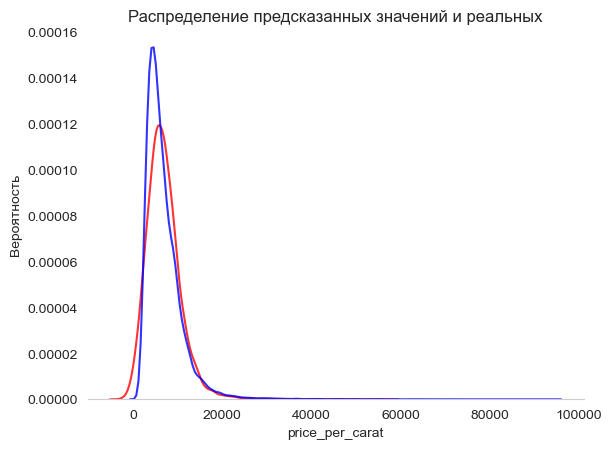

--------------------------------------------------
С учетом инфляции
MSE:  4859408.0491363015
root MSE:  2204.406507234158
MAE:  1314.651064716557
MAX_ERROR:  73090.74894426507
R2:  0.7510108861939607
MAPE:  0.22100574781330057


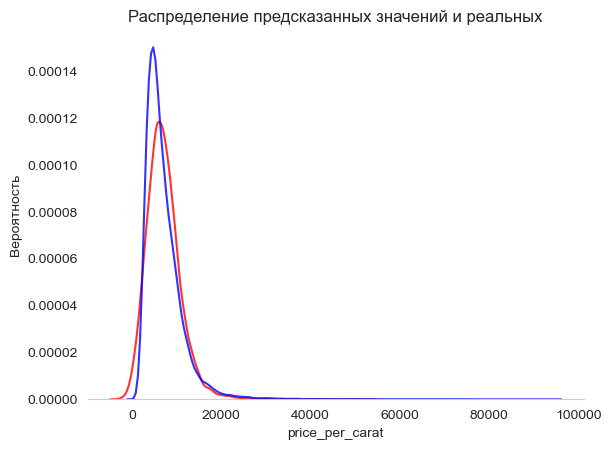

In [48]:
print("Без учета инфляции")
baseline(lr, df, "price_per_carat")
print("-" * 50)
print("С учетом инфляции")
baseline(lr, df_with_inf, "price_per_carat")
print()

Без учета инфляции, с нормализацией
MSE:  3890796.297664078
root MSE:  1972.5101514730102
MAE:  1170.9477442854304
MAX_ERROR:  71549.22944425588
R2:  0.7926376156256539
MAPE:  0.20475779021630305


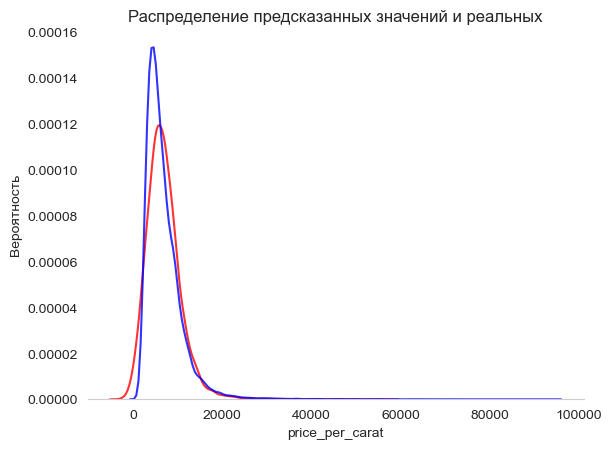

--------------------------------------------------
С учетом инфляции, с нормализацией
MSE:  4859408.049136314
root MSE:  2204.406507234161
MAE:  1314.6510647165974
MAX_ERROR:  73090.74894426465
R2:  0.7510108861939602
MAPE:  0.22100574781331395


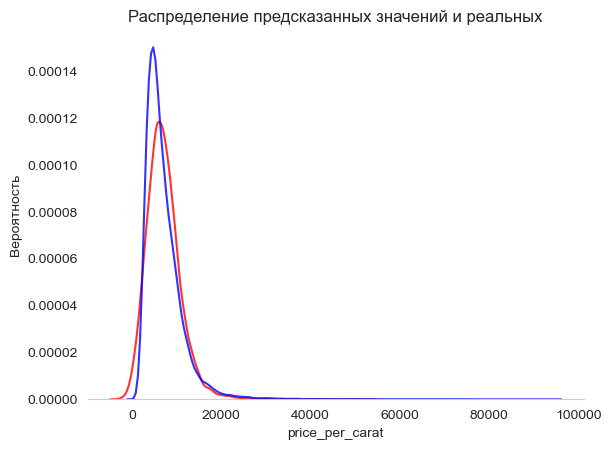

In [49]:
print("Без учета инфляции, с нормализацией")
baseline(lr, df, "price_per_carat", True)
print("-" * 50)
print("С учетом инфляции, с нормализацией")
baseline(lr, df_with_inf, "price_per_carat", True)
print()

Мы сравнили результаты работы модели на данных с и без инфляции. 

И сравнили две функции потерь: MSE и MAE: 
MSЕ - среднеквадратичная ошибка. Она сильнее штрафует за большие ошибки, чем MAE. Видно, что для данных с инфляцией MSE дает более чувствительный результат. MAE не учитывает значения выбросов. Поэтому, можно предположить, что в нашем случае подойдет MSE. Однако, мы знаем, что в данных, помимо выбросов могут быть, к примеру, очень дорогие камни. И в таком случае, MSE будет сильно штрафовать за ошибку, а не учитывать эти значения в модели будет ошибкой. Поэтому, в данном случае, лучше использовать MAE.

Причем нормализация данных в данном случае не дает улучшения результата. В дальнейшем, будем использовать данные без нее.

Попробуем добавить полиномиальные признаки и сравним результаты:

Без учета инфляции, с 2-мя полиномиальными признаками
MSE:  1306567.606508337
root MSE:  1143.0518826843936
MAE:  670.2234953861879
MAX_ERROR:  62892.86976197738
R2:  0.9303656749147954
MAPE:  0.1102851965985127


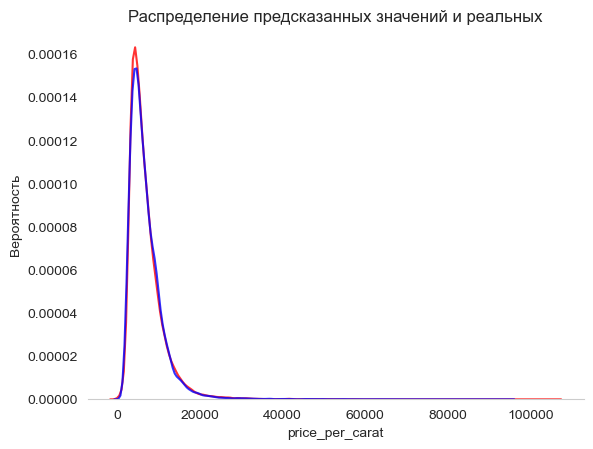

--------------------------------------------------
С учетом инфляции, с 2-мя полиномиальными признаками
MSE:  2325398.978318524
root MSE:  1524.9258927300448
MAE:  863.2529128851512
MAX_ERROR:  68298.63301460889
R2:  0.8808498843887151
MAPE:  0.1379086469467761


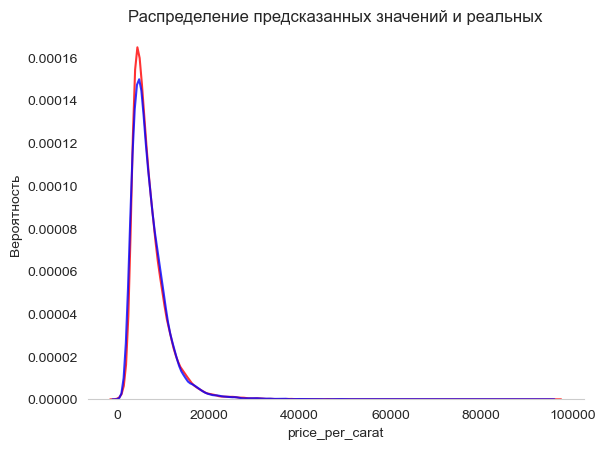

In [50]:
print("Без учета инфляции, с 2-мя полиномиальными признаками")
baseline(lr, df, "price_per_carat", False, 2)
print("-" * 50)
print("С учетом инфляции, с 2-мя полиномиальными признаками")
baseline(lr, df_with_inf, "price_per_carat", False, 2)
print()

Без учета инфляции, с 3-мя полиномиальными признаками
MSE:  988396.5533699903
root MSE:  994.1813483313748
MAE:  588.374265755362
MAX_ERROR:  59707.793627929685
R2:  0.9473227971001112
MAPE:  0.0944382963181396


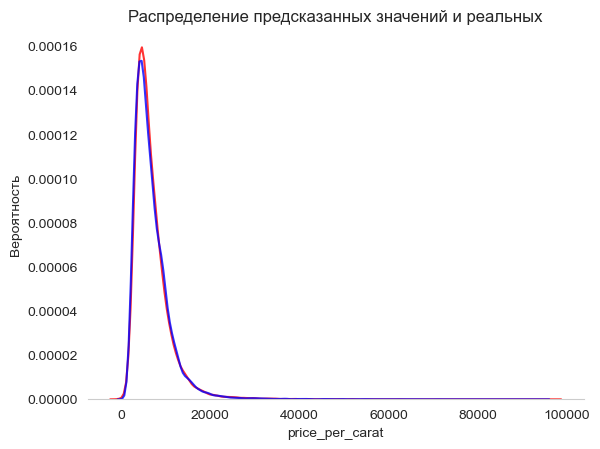

--------------------------------------------------
С учетом инфляции, с 3-мя полиномиальными признаками
MSE:  2059791.1750129936
root MSE:  1435.1972599656792
MAE:  799.5514078067339
MAX_ERROR:  67521.75122804978
R2:  0.8944592481005704
MAPE:  0.1247276309315889


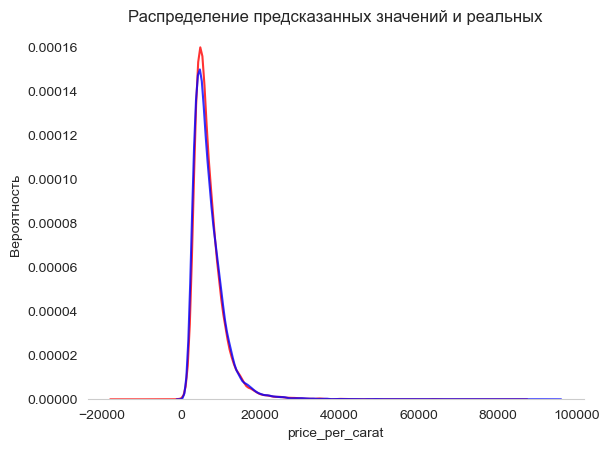

In [51]:
print("Без учета инфляции, с 3-мя полиномиальными признаками")
baseline(lr, df, "price_per_carat", False, 3)
print("-" * 50)
print("С учетом инфляции, с 3-мя полиномиальными признаками")
baseline(lr, df_with_inf, "price_per_carat", False, 3)
print()

Попробуем добавить категориальные признаки:

In [3]:
from sklearn.preprocessing import OneHotEncoder
from category_encoders import TargetEncoder
from sklearn.preprocessing import StandardScaler

from typing import Tuple, List


def OHE(df_: pd.DataFrame, columns_: List[str]) -> pd.DataFrame:
    """
    Вместо это функции можно использовать и функционал pandas
    """
    index_ = df_.index
    one = OneHotEncoder(sparse_output=False, categories="auto")
    ohe = one.fit_transform(df_[columns_])
    df_ = pd.concat([df_.drop(columns=columns_).reset_index(drop=True), pd.DataFrame(ohe, columns=one.get_feature_names_out(columns_))], axis=1)
    df_ = df_.set_index(index_)
    return df_

def TE(df_: pd.DataFrame, columns_: List[str]) -> pd.DataFrame:
    index_ = df_.index
    te = TargetEncoder(cols=columns_, drop_invariant=True, return_df=True)
    ohe = te.fit_transform(df_[columns_], df_.price_per_carat)
    df_ = pd.concat([df_.drop(columns=columns_).reset_index(drop=True), ohe], axis=1)
    df_ = df_.set_index(index_)
    return df_

scaler = StandardScaler() # делаем только transform

In [54]:
df_new = pd.read_csv("diamonds.csv", index_col=0)

df_new.drop(columns=["depth_perc", "price", "platform"], inplace=True)
df_new = df_new[~(df_new.id == 0)]

df_new.fluor.fillna("NONE", inplace=True)
df_new.cut.fillna("NONE", inplace=True)

df_new.drop_duplicates(inplace=True)
df_new.reset_index(drop=True, inplace=True)

df_new["dt"] = pd.to_datetime(df_new.date, format="%Y%m")
df_new["month"] = df_new.dt.dt.month.astype(float)
df_new.drop(columns=["date", "dt"], inplace=True)

df_new["duplicates_count"] = df_new.id.map(df_new.groupby(by="id")["carat"].count().to_dict())
df_one = df_new[df_new.duplicates_count == 1].copy()
df_three = df_new[df_new.duplicates_count > 1].copy()

df_three = df_three.query("id in @df_three_pivot_dif.index").sort_values(by=["id", "month"])
df_three = df_three.groupby("id").agg("last").reset_index()

df_new = pd.concat([df_one, df_three]).reset_index(drop=True)

df_index = df_new.groupby(["month"] + categories)[['price_per_carat']].mean().reset_index()
date_max_ = df_index.month.max()
df_index = df_index.merge(
    df_index.query("month == @date_max_")[categories + ["price_per_carat"]].rename(columns={"price_per_carat": "price_per_carat_max"}), on=categories, how="outer"
)
df_index["inflation"] = df_index["price_per_carat_max"] / df_index.price_per_carat
df_with_inf_new = df_new.merge(df_index[["month"] + categories + ["inflation"]], on=["month"] + categories, how="left")
df_with_inf_new.inflation.fillna(1.0, inplace=True)
df_with_inf_new["price_per_carat"] = df_with_inf_new.price_per_carat * df_with_inf_new.inflation
df_with_inf_new.drop(columns=["inflation"], inplace=True)

df_with_inf_new.head()

,fluor,symmetry,shape,color,clarity,cut,polish,id,carat,price_per_carat,z,x,y,month,duplicates_count
0,NONE,EX,PS,D,SI2,NONE,EX,14224443,1.51,6511.488735,10.67,6.23,3.67570,5.0,1
1,NONE,VG,EM,K,SI2,NONE,VG,12902293,0.91,1508.217350,6.30,4.58,3.25180,5.0,1
2,NONE,VG,PS,J,VS1,NONE,VG,12771762,2.27,7044.050000,11.66,7.26,4.51572,7.0,1
3,MED,EX,RD,J,SI2,EX,EX,14584509,1.01,3061.041157,6.37,6.42,3.98040,5.0,1
4,NONE,EX,RD,G,SI1,EX,EX,14773748,1.00,7322.026227,6.30,6.35,4.04495,6.0,1


Применим one hot encoding к категориальным признакам:

**Метод get_dummies**

In [55]:
df_with_inf_new_1 = pd.get_dummies(df_with_inf_new, columns=df_with_inf_new.select_dtypes(object).columns, drop_first=True, dtype=int)
df_with_inf_new_1.head()

,id,carat,price_per_carat,z,x,y,month,duplicates_count,fluor_MED,fluor_NONE,...,clarity_SI2,clarity_VS1,clarity_VS2,clarity_VVS1,clarity_VVS2,cut_G,cut_NONE,cut_VG,polish_G,polish_VG
0,14224443,1.51,6511.488735,10.67,6.23,3.67570,5.0,1,0,1,...,1,0,0,0,0,0,1,0,0,0
1,12902293,0.91,1508.217350,6.30,4.58,3.25180,5.0,1,0,1,...,1,0,0,0,0,0,1,0,0,1
2,12771762,2.27,7044.050000,11.66,7.26,4.51572,7.0,1,0,1,...,0,1,0,0,0,0,1,0,0,1
3,14584509,1.01,3061.041157,6.37,6.42,3.98040,5.0,1,1,0,...,1,0,0,0,0,0,0,0,0,0
4,14773748,1.00,7322.026227,6.30,6.35,4.04495,6.0,1,0,1,...,0,0,0,0,0,0,0,0,0,0


Без нормализации
MSE:  4605287.006475306
root MSE:  2145.993244741303
MAE:  1248.0171221626435
MAX_ERROR:  71710.83249615679
R2:  0.7640316847298799
MAPE:  0.2112051089639793


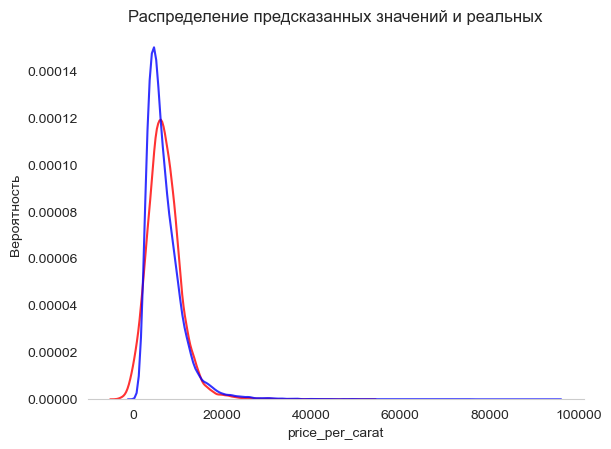

--------------------------------------------------
С нормализацией
MSE:  4605659.526180158
root MSE:  2146.0800372260487
MAE:  1248.158647387002
MAX_ERROR:  71707.02386478297
R2:  0.7640125973533418
MAPE:  0.21124368990893105


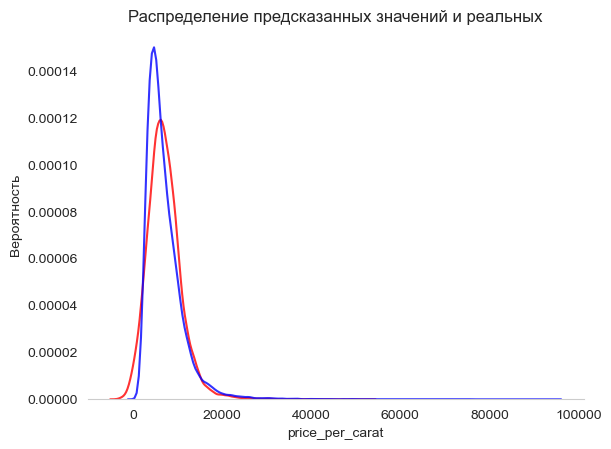

In [56]:
print("Без нормализации")
baseline(lr, df_with_inf_new_1, "price_per_carat")
print("-" * 50)
print("С нормализацией")
baseline(lr, df_with_inf_new_1, "price_per_carat", True)
print()

Заметим, что максимальное значение ошибки уменьшилось, а среднеквадратичная ошибка увеличилась. Поэтому, в данном случае, лучше использовать данные без нормализации.

**Метод OneHotEncoder**

In [57]:
df_with_inf_new_2 = OHE(df_with_inf_new, df_with_inf_new.select_dtypes(object).columns.tolist())
df_with_inf_new_2.head()

,id,carat,price_per_carat,z,x,y,month,duplicates_count,fluor_FNT,fluor_MED,...,clarity_VS2,clarity_VVS1,clarity_VVS2,cut_EX,cut_G,cut_NONE,cut_VG,polish_EX,polish_G,polish_VG
0,14224443,1.51,6511.488735,10.67,6.23,3.67570,5.0,1,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
1,12902293,0.91,1508.217350,6.30,4.58,3.25180,5.0,1,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
2,12771762,2.27,7044.050000,11.66,7.26,4.51572,7.0,1,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
3,14584509,1.01,3061.041157,6.37,6.42,3.98040,5.0,1,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
4,14773748,1.00,7322.026227,6.30,6.35,4.04495,6.0,1,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0


Без нормализации
MSE:  4609451.69801713
root MSE:  2146.9633667152148
MAE:  1242.2311526660765
MAX_ERROR:  71862.7
R2:  0.7638182918956522
MAPE:  0.20935538365983633


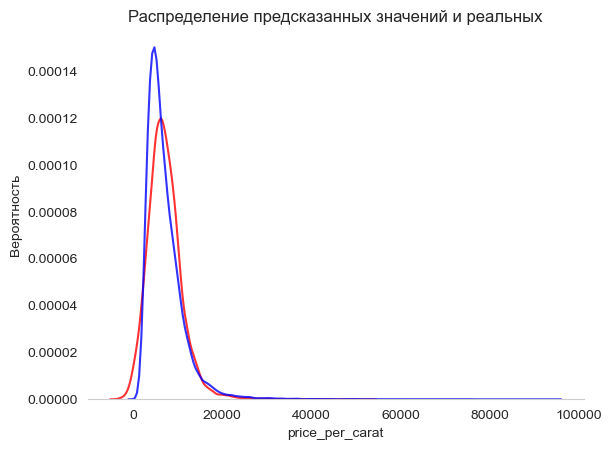

--------------------------------------------------
С нормализацией
MSE:  4605196.183145584
root MSE:  2145.972083496331
MAE:  1248.5555007346884
MAX_ERROR:  71694.15399359971
R2:  0.7640363383873114
MAPE:  0.21135274872510687


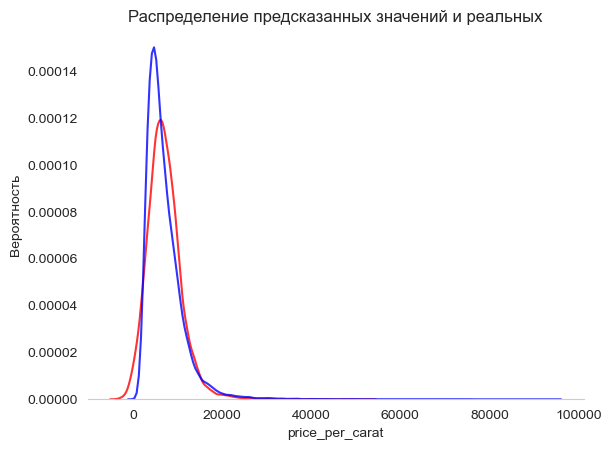

In [58]:
print("Без нормализации")
baseline(lr, df_with_inf_new_2, "price_per_carat")
print("-" * 50)
print("С нормализацией")
baseline(lr, df_with_inf_new_2, "price_per_carat", True)
print()

Для данных с нормализацией, среднеквадратичная ошибка уменьшилась, как и максимальное значение ошибки. Поэтому, в данном случае, лучше использовать данные с нормализацией.

**Метод TargetEncoder**

In [59]:
df_with_inf_new_3 = TE(df_with_inf_new, df_with_inf_new.select_dtypes(object).columns.tolist())
df_with_inf_new_3.head()

,id,carat,price_per_carat,z,x,y,month,duplicates_count,fluor,symmetry,shape,color,clarity,cut,polish
0,14224443,1.51,6511.488735,10.67,6.23,3.67570,5.0,1,7260.584586,7989.464031,6260.068299,9467.154899,5189.920590,5982.888296,7304.212086
1,12902293,0.91,1508.217350,6.30,4.58,3.25180,5.0,1,7260.584586,5733.451210,5916.681026,4377.878208,5189.920590,5982.888296,5455.112922
2,12771762,2.27,7044.050000,11.66,7.26,4.51572,7.0,1,7260.584586,5733.451210,6260.068299,5185.607155,8037.076516,5982.888296,5455.112922
3,14584509,1.01,3061.041157,6.37,6.42,3.98040,5.0,1,6858.148955,7989.464031,8101.206211,5185.607155,5189.920590,8290.895198,7304.212086
4,14773748,1.00,7322.026227,6.30,6.35,4.04495,6.0,1,7260.584586,7989.464031,8101.206211,7457.792245,6286.658467,8290.895198,7304.212086


Без нормализации
MSE:  4899627.174084672
root MSE:  2213.510147725705
MAE:  1301.3188598211689
MAX_ERROR:  72027.36638692333
R2:  0.7489501157919508
MAPE:  0.2142522487331293


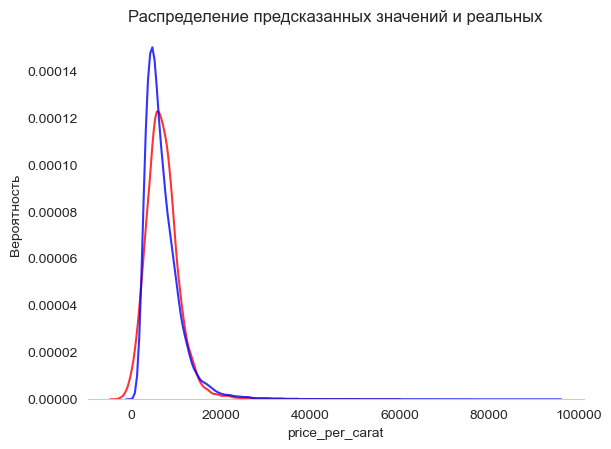

--------------------------------------------------
С нормализацией
MSE:  4899627.174084676
root MSE:  2213.510147725706
MAE:  1301.3188598211798
MAX_ERROR:  72027.36638692324
R2:  0.7489501157919506
MAPE:  0.2142522487331332


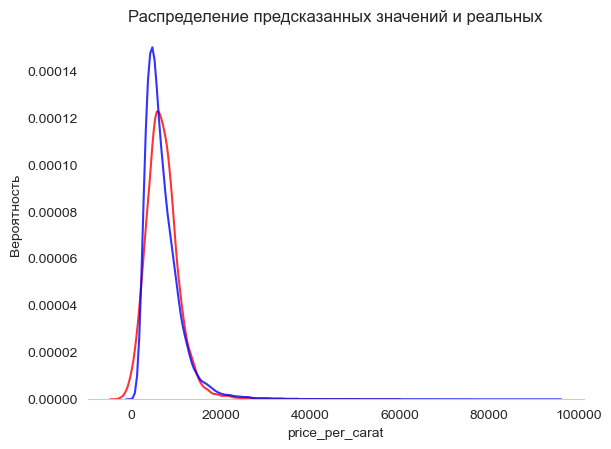

In [60]:
print("Без нормализации")
baseline(lr, df_with_inf_new_3, "price_per_carat")
print("-" * 50)
print("С нормализацией")
baseline(lr, df_with_inf_new_3, "price_per_carat", True)
print()

С учетом и без учета нормализации, среднеквадратичная ошибка осталась прежней.

Из наблюдений можно сделать вывод, что лучше показал себя, в данном случае, вариант с последовательной предобработкой кажого категориального признака:

**Без учета инфляции**

- MSE:  3890796.297664059
- root MSE:  1972.5101514730054
- MAE:  1170.9477442853859
- MAX_ERROR:  71549.22944425611
- R2:  0.7926376156256549
- MAPE:  0.20475779021628812

Это связано с тем, что практически все столбцы с категориальными признаками имеют внутреннюю логику, которую лучше учитывать. Например, чем выше цвет или чем лучше полировка, тем выше цена.

Следующим по качеству оказался вариант с использованием **OneHotEncoder** и нормализацией:

**С нормализацией**

- MSE:  4605196.183145584
- root MSE:  2145.972083496331
- MAE:  1248.5555007346884
- MAX_ERROR:  71694.15399359971
- R2:  0.7640363383873114
- MAPE:  0.21135274872510687

В данном случае, нормализация данных улучшила результаты, т.к. в данных присутствуют выбросы, которые сильно влияют на результат.

---

Самым худшим оказались варианты с использованием **TargetEncoder** и нормализацией:

**С нормализацией**

- MSE:  4899627.174084676
- root MSE:  2213.510147725706
- MAE:  1301.3188598211798
- MAX_ERROR:  72027.36638692324
- R2:  0.7489501157919506
- MAPE:  0.2142522487331332


И с последовательной предобработкой кажого категориального признака (с учетом инфляции):

**С учетом инфляции**

- MSE:  4859408.0491363015
- root MSE:  2204.406507234158
- MAE:  1314.651064716557
- MAX_ERROR:  73090.74894426507
- R2:  0.7510108861939607
- MAPE:  0.22100574781330057

---

В качестве добавочного эксперимента, мы попробовали добавить полиномиальные признаки. В данном случае, мы получили следующие результаты:

**Без учета инфляции, с 2-мя полиномиальными признаками**

- MSE:  1306567.606508337
- root MSE:  1143.0518826843936
- MAE:  670.2234953861879
- MAX_ERROR:  62892.86976197738
- R2:  0.9303656749147954
- MAPE:  0.1102851965985127

**С учетом инфляции, с 2-мя полиномиальными признаками**

- MSE:  2325398.978318524
- root MSE:  1524.9258927300448
- MAE:  863.2529128851512
- MAX_ERROR:  68298.63301460889
- R2:  0.8808498843887151
- MAPE:  0.1379086469467761

**Без учета инфляции, с 3-мя полиномиальными признаками**

- MSE:  988396.5533699903
- root MSE:  994.1813483313748
- MAE:  588.374265755362
- MAX_ERROR:  59707.793627929685
- R2:  0.9473227971001112
- MAPE:  0.0944382963181396

**С учетом инфляции, с 3-мя полиномиальными признаками**
- MSE:  2059791.1750129936
- root MSE:  1435.1972599656792
- MAE:  799.5514078067339
- MAX_ERROR:  67521.75122804978
- R2:  0.8944592481005704
- MAPE:  0.1247276309315889

Можем заметить, что добавление полиномиальных признаков улучшило результаты. Причем, чем больше признаков, тем лучше результат. Однако, в данном случае, мы не можем сказать, что это улучшение связано с добавлением полиномиальных признаков. Но, как мы знаем, с полиномами мы можем переобучить модель, которая будет показывать хорошие результаты на тренировочных данных, но плохие на реальных.

Сравним работу выбранной нами линейной модели с KNN:

In [4]:
from sklearn.neighbors import KNeighborsRegressor

def knn(X_train_: pd.DataFrame, X_valid_: pd.DataFrame, y_train_: pd.Series, y_valid_: pd.Series) -> tuple:
    model_ = KNeighborsRegressor(n_neighbors=5)
    model_.fit(X_train_, y_train_)
    y_pred_ = model_.predict(X_valid_)
    return y_valid_, y_pred_

In [62]:
print("Без учета инфляции")
baseline(lr, df, "price_per_carat", ex_model_=knn)
print("-" * 50)
print("С учетом инфляции")
baseline(lr, df_with_inf, "price_per_carat", ex_model_=knn)
print()

Без учета инфляции
MSE (KNN | LR):  2598067.621917222  |  3890796.297664059
MAE (KNN | LR):  592.064091341874  |  1170.9477442853859
MAX_ERROR (KNN | LR):  188076.532  |  71549.22944425611
R2 (KNN | LR):  0.8615343863748439  |  0.7926376156256549
MAPE (KNN | LR):  0.09257773890402875  |  0.20475779021628812
--------------------------------------------------
С учетом инфляции
MSE (KNN | LR):  3495554.344117238  |  4859408.0491363015
MAE (KNN | LR):  771.8124344495894  |  1314.651064716557
MAX_ERROR (KNN | LR):  188895.33146199785  |  73090.74894426507
R2 (KNN | LR):  0.820892798134683  |  0.7510108861939607
MAPE (KNN | LR):  0.11844641339055774  |  0.22100574781330057


Модель KNN показала лучшие результаты, чем линейная модель. Это может свидетельствовать о том, что данные нелинейны. Попробуем добавить полиномиальные признаки и сравним результаты.

In [63]:
print("Без учета инфляции, с 2-мя полиномиальными признаками")
baseline(lr, df, "price_per_carat", False, 2, knn)
print("-" * 50)
print("С учетом инфляции, с 2-мя полиномиальными признаками")
baseline(lr, df_with_inf, "price_per_carat", False, 2, knn)
print()

Без учета инфляции, с 2-мя полиномиальными признаками
MSE (KNN | LR):  1204654.4567137745  |  1306567.606508337
MAE (KNN | LR):  584.0357892170143  |  670.2234953861879
MAX_ERROR (KNN | LR):  48581.704  |  62892.86976197738
R2 (KNN | LR):  0.935797198984351  |  0.9303656749147954
MAPE (KNN | LR):  0.0919747992287731  |  0.1102851965985127
--------------------------------------------------
С учетом инфляции, с 2-мя полиномиальными признаками
MSE (KNN | LR):  2153904.047634977  |  2325398.978318524
MAE (KNN | LR):  764.5258319394554  |  863.2529128851512
MAX_ERROR (KNN | LR):  67329.89221762068  |  68298.63301460889
R2 (KNN | LR):  0.8896370391987982  |  0.8808498843887151
MAPE (KNN | LR):  0.11796720307917227  |  0.1379086469467761


При добавлении полиномиальных признаков, результаты улучшились. В случае KNN совсем на немного, а в случае линейной модели, на порядок, сравнимо с результатами KNN.

# Classification

---

Загрузим датасет bodyPerformance

[Описание](https://www.kaggle.com/datasets/kukuroo3/body-performance-data)

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')
# 
# path = 'drive/MyDrive/'

In [5]:
df = pd.read_csv("bodyPerformance.csv") #укажите свой путь

In [6]:
df

,age,gender,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm,class
0,27.0,M,172.3,75.24,21.3,80.0,130.0,54.9,18.4,60.0,217.0,C
1,25.0,M,165.0,55.80,15.7,77.0,126.0,36.4,16.3,53.0,229.0,A
2,31.0,M,179.6,78.00,20.1,92.0,152.0,44.8,12.0,49.0,181.0,C
3,32.0,M,174.5,71.10,18.4,76.0,147.0,41.4,15.2,53.0,219.0,B
4,28.0,M,173.8,67.70,17.1,70.0,127.0,43.5,27.1,45.0,217.0,B
...,...,...,...,...,...,...,...,...,...,...,...,...
13388,25.0,M,172.1,71.80,16.2,74.0,141.0,35.8,17.4,47.0,198.0,C
13389,21.0,M,179.7,63.90,12.1,74.0,128.0,33.0,1.1,48.0,167.0,D
13390,39.0,M,177.2,80.50,20.1,78.0,132.0,63.5,16.4,45.0,229.0,A
13391,64.0,F,146.1,57.70,40.4,68.0,121.0,19.3,9.2,0.0,75.0,D


In [77]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13393 entries, 0 to 13392
Data columns (total 12 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   age                      13393 non-null  float64
 1   gender                   13393 non-null  object 
 2   height_cm                13393 non-null  float64
 3   weight_kg                13393 non-null  float64
 4   body fat_%               13393 non-null  float64
 5   diastolic                13393 non-null  float64
 6   systolic                 13393 non-null  float64
 7   gripForce                13393 non-null  float64
 8   sit and bend forward_cm  13393 non-null  float64
 9   sit-ups counts           13393 non-null  float64
 10  broad jump_cm            13393 non-null  float64
 11  class                    13393 non-null  object 
dtypes: float64(10), object(2)
memory usage: 1.2+ MB


### Gender

---

Построим модель, которая будет определять гендер. Для этого определим две метрики качества, на которые мы будете смотреть. 

После чего преобразуем категориальные переменные и построем модель бинарной классификации на основе линейного классификатора и сравните с KNN.

Основной категориальный признак в данном датасете - пол. Именно его мы должны предсказать, поэтому, для начала, мы преобразуем его в числовой признак.
Т.к. пола всего два, то признак будет бинарным. Поэтому, для преобразования, мы будем использовать LabelEncoder.

In [7]:
from sklearn.preprocessing import LabelEncoder


le = LabelEncoder()
df["gender"] = le.fit_transform(df["gender"])
df.head()

,age,gender,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm,class
0,27.0,1,172.3,75.24,21.3,80.0,130.0,54.9,18.4,60.0,217.0,C
1,25.0,1,165.0,55.80,15.7,77.0,126.0,36.4,16.3,53.0,229.0,A
2,31.0,1,179.6,78.00,20.1,92.0,152.0,44.8,12.0,49.0,181.0,C
3,32.0,1,174.5,71.10,18.4,76.0,147.0,41.4,15.2,53.0,219.0,B
4,28.0,1,173.8,67.70,17.1,70.0,127.0,43.5,27.1,45.0,217.0,B


0 - Женский пол
1 - Мужской пол

In [8]:
df.gender.value_counts()

gender
1    8467
0    4926
Name: count, dtype: int64

Так же, у нас присутствует признак `class` - класс, к которому относится человек. Так как он говорит нам о принадлежности к определенному классу физической формы, то мы можем сделать предположение, что он может быть полезен для определения гендера. Поэтому, мы так же преобразуем его в числовой признак.

In [34]:
df["class"] = le.fit_transform(df["class"])
df.head()

,age,gender,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm,class
0,27.0,1,172.3,75.24,21.3,80.0,130.0,54.9,18.4,60.0,217.0,2
1,25.0,1,165.0,55.80,15.7,77.0,126.0,36.4,16.3,53.0,229.0,0
2,31.0,1,179.6,78.00,20.1,92.0,152.0,44.8,12.0,49.0,181.0,2
3,32.0,1,174.5,71.10,18.4,76.0,147.0,41.4,15.2,53.0,219.0,1
4,28.0,1,173.8,67.70,17.1,70.0,127.0,43.5,27.1,45.0,217.0,1


0 - А
1 - B
2 - C
3 - D

In [35]:
df["class"].value_counts()

class
2    3349
3    3349
0    3348
1    3347
Name: count, dtype: int64

Посмотрим на корреляцию признаков:

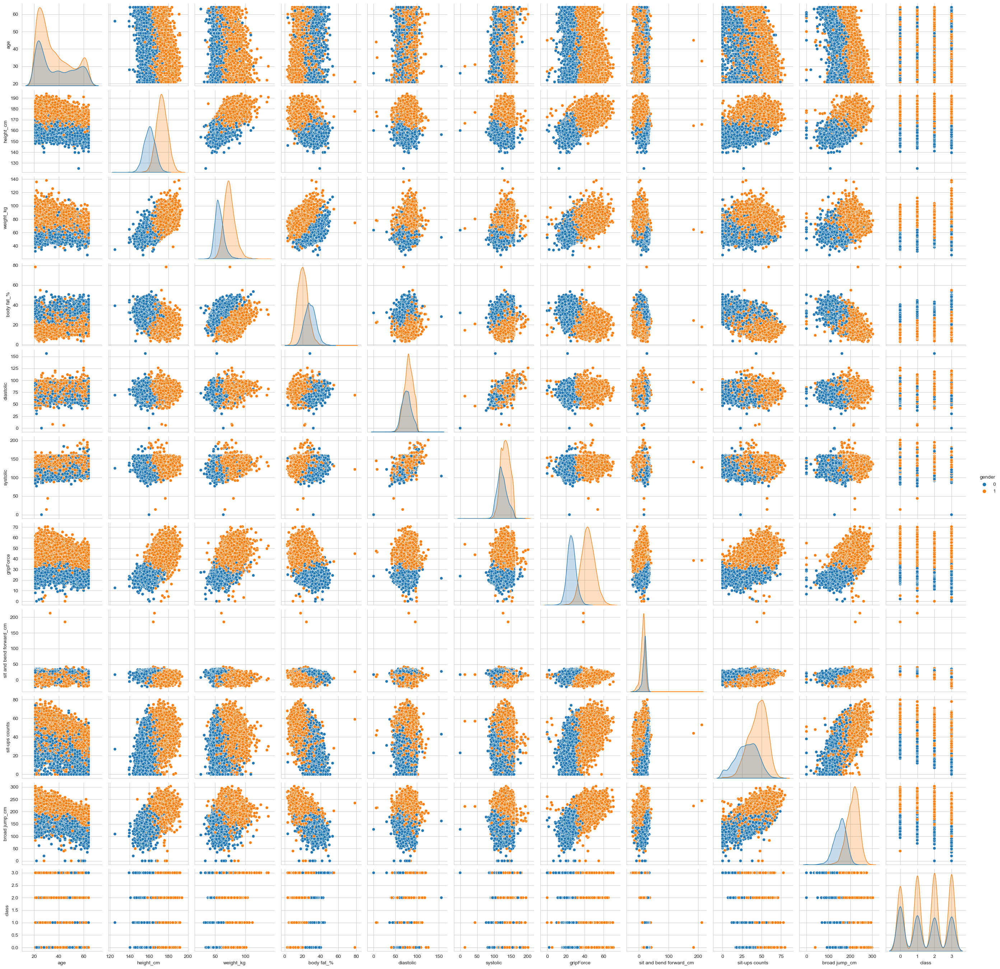

In [36]:
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)
sns.pairplot(df, hue="gender")
plt.show()

Для определения гендера, мы будем использовать метрики качества: accuracy и f1.
>Accuracy покажет нам долю верно угаданных ответов. f1 - это среднее гармоническое точности и полноты. Оно одинаково учитывает важность точности и полноты и потому показыает четкую картину работы алгоритма. Поэтому, в данном случае, мы будем использовать именно эти метрики.


In [64]:
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc, confusion_matrix


def print_b_model_metrics(y_train_, y_pred_train_, y_test_, y_pred_test_) -> None:
    print("TEST:  Accuracy -- ", accuracy_score(y_train_, y_pred_train_))
    print("TRAIN: Accuracy -- ", accuracy_score(y_test_, y_pred_test_))
    print("-" * 50)
    print(f"TEST:  F1 -- {f1_score(y_train_, y_pred_train_)}")
    print(f"TRAIN: F1 -- {f1_score(y_test_, y_pred_test_)}")
    print("-" * 50)
    print(f"TEST:  ROC_AUC -- {roc_auc_score(y_train_, y_pred_train_)}")
    print(f"TRAIN: ROC_AUC -- {roc_auc_score(y_test_, y_pred_test_)}")
    print("-" * 50)

def print_mult_model_metrics(y_train_, y_pred_train_, y_pred_prob_train_, y_test_, y_pred_test_, y_pred_prob_test_) -> None:
    print("MACRO PRECISION: ", precision_score(y_train_, y_pred_train_, average="macro"))
    print("MICRO PRECISION: ", precision_score(y_test_, y_pred_test_, average="micro"))
    print("-" * 50)
    print("MACRO RECALL: ", recall_score(y_train_, y_pred_train_, average="macro"))
    print("MICRO RECALL: ", recall_score(y_test_, y_pred_test_, average="micro"))
    print("-" * 50)
    print("OvO:", roc_auc_score(y_train_, y_pred_prob_train_, multi_class="ovo"))
    print("OvR:", roc_auc_score(y_test_, y_pred_prob_test_, multi_class="ovr"))
    print("-" * 50)

def plot_roc_auc(y_test_: np.array, y_pred_prob_lr_: np.array, y_pred_prob_knn_: np.array) -> None:
    fpr_lr_, tpr_lr_, thresholds_lr_ = roc_curve(y_test_, y_pred_prob_lr_[:, 1])
    fpr_knn_, tpr_knn_, thresholds_knn_ = roc_curve(y_test_, y_pred_prob_knn_[:, 1])

    plt.figure(figsize=(10, 10))
    plt.plot(fpr_lr_, tpr_lr_, label="LinearRegression")
    plt.plot(fpr_knn_, tpr_knn_, label="KNeighborsRegressor")
    plt.plot([0, 1], [0, 1], linestyle="--", label="Random")

    plt.title(f'ROC AUC = {round(auc(fpr_lr_, tpr_lr_),2)}|{round(auc(fpr_knn_, tpr_knn_), 2)}')
    plt.ylabel("True Positive Rate", fontsize=20)
    plt.xlabel("False Positive Rate", fontsize=20)

    plt.legend()
    plt.grid(False)
    plt.show()

def plot_heat_map(y_: np.array, y_pred_: np.array, labels_: List[str]) -> None:
    mp_mtx = confusion_matrix(y_, y_pred_)

    fig = plt.figure(figsize=(10,8))
    
    plt.rc("xtick", labelsize=15)
    plt.rc("ytick", labelsize=15)
    sns.heatmap(
        mp_mtx, 
        annot=True, 
        fmt="d",
        xticklabels=labels_,
        yticklabels=labels_
    )
    
    plt.ylabel("Реальное значение")
    plt.xlabel("Предсказанное значение")
    plt.show()

def baseline(df_: pd.DataFrame, col_: str, n_neighbors_: int = 3) -> None:
    b_col_ = df_[col_].nunique() == 2
    
    X_ = df_.drop(columns=col_)
    y_ = df_[col_]

    X_train_, X_test_, y_train_, y_test_ = train_test_split(X_, y_, test_size=0.2, random_state=13, stratify=y_, shuffle=True)

    scaler_ = StandardScaler()
    scaler_.fit(X_train_)
    X_train_ = pd.DataFrame(scaler_.transform(X_train_), columns=X_train_.columns, index=X_train_.index)
    X_test_ = pd.DataFrame(scaler_.transform(X_test_), columns=X_test_.columns, index=X_test_.index)
    
    print("LinearRegression")
    print("-" * 50)
    
    model_lr_ = LogisticRegression()
    model_lr_.fit(X_train_, y_train_)
    
    print("TRAIN")
    y_train_pred_lr_ = model_lr_.predict(X_train_)
    plot_heat_map(y_train_, y_train_pred_lr_, y_train_.unique().tolist())
    y_pred_prob_train_lr_ = model_lr_.predict_proba(X_train_)
    
    print("TEST")
    y_test_pred_lr_ = model_lr_.predict(X_test_)
    plot_heat_map(y_test_, y_test_pred_lr_, y_test_.unique().tolist())
    y_pred_prob_test_lr_ = model_lr_.predict_proba(X_test_)
    
    if b_col_:
        print_b_model_metrics(y_train_, y_train_pred_lr_, y_test_, y_test_pred_lr_)
    else:
        print_mult_model_metrics(y_train_, y_train_pred_lr_, y_pred_prob_train_lr_, y_test_, y_test_pred_lr_, y_pred_prob_test_lr_)
    
    print()
    
    print("KNeighborsRegressor")
    print("-" * 50)
    
    model_knn_ = KNeighborsClassifier(n_neighbors=n_neighbors_)
    model_knn_.fit(X_train_, y_train_)

    print("TRAIN")
    y_train_pred_knn_ = model_knn_.predict(X_train_)
    plot_heat_map(y_train_, y_train_pred_knn_, y_train_.unique().tolist())
    y_pred_prob_train_knn_ = model_knn_.predict_proba(X_train_)
    
    print("TEST")
    y_test_pred_knn_ = model_knn_.predict(X_test_)
    plot_heat_map(y_test_, y_test_pred_knn_, y_test_.unique().tolist())
    y_pred_prob_test_knn_ = model_knn_.predict_proba(X_test_)

    if b_col_:
        print_b_model_metrics(y_train_, y_train_pred_knn_, y_test_, y_test_pred_knn_)
    else:
        print_mult_model_metrics(y_train_, y_train_pred_knn_, y_pred_prob_train_knn_, y_test_, y_test_pred_knn_, y_pred_prob_test_knn_)
    
    print()
    
    if b_col_:
        print("ROC_AUC TRAIN")
        plot_roc_auc(y_train_, y_pred_prob_train_lr_, y_pred_prob_train_knn_)
        print("ROC_AUC TEST")
        plot_roc_auc(y_test_, y_pred_prob_test_lr_, y_pred_prob_test_knn_)
        print("-" * 50)

LinearRegression
--------------------------------------------------
TRAIN


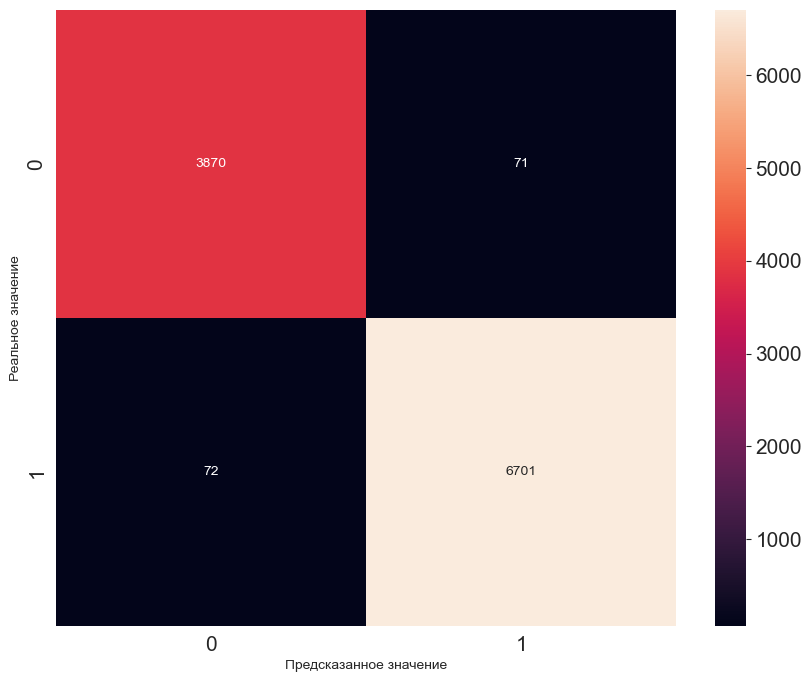

TEST


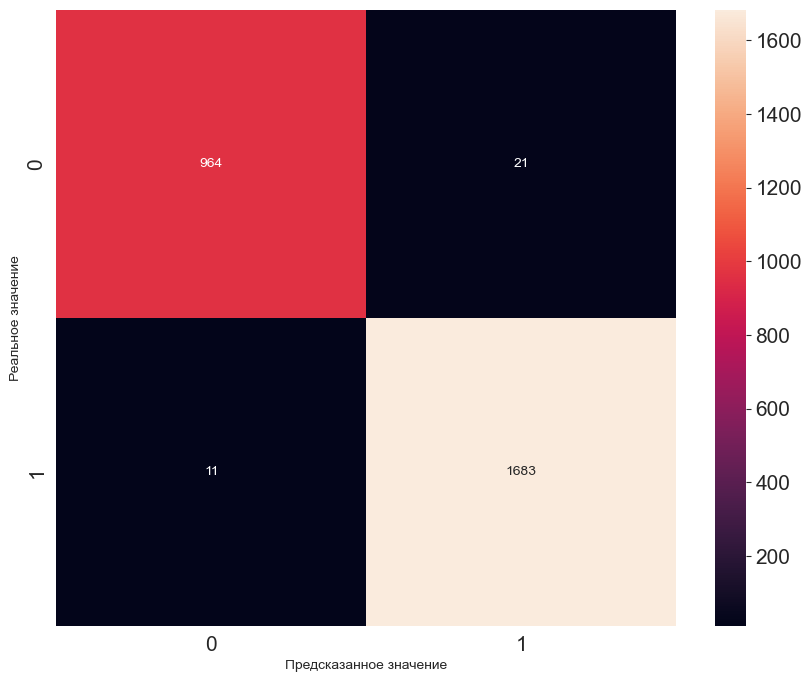

TEST:  Accuracy --  0.9866529774127311
TRAIN: Accuracy --  0.9880552444942142
--------------------------------------------------
TEST:  F1 -- 0.9894425987449244
TRAIN: F1 -- 0.990582695703355
--------------------------------------------------
TEST:  ROC_AUC -- 0.9856769117703309
TRAIN: ROC_AUC -- 0.9860933482760894
--------------------------------------------------

KNeighborsRegressor
--------------------------------------------------
TRAIN


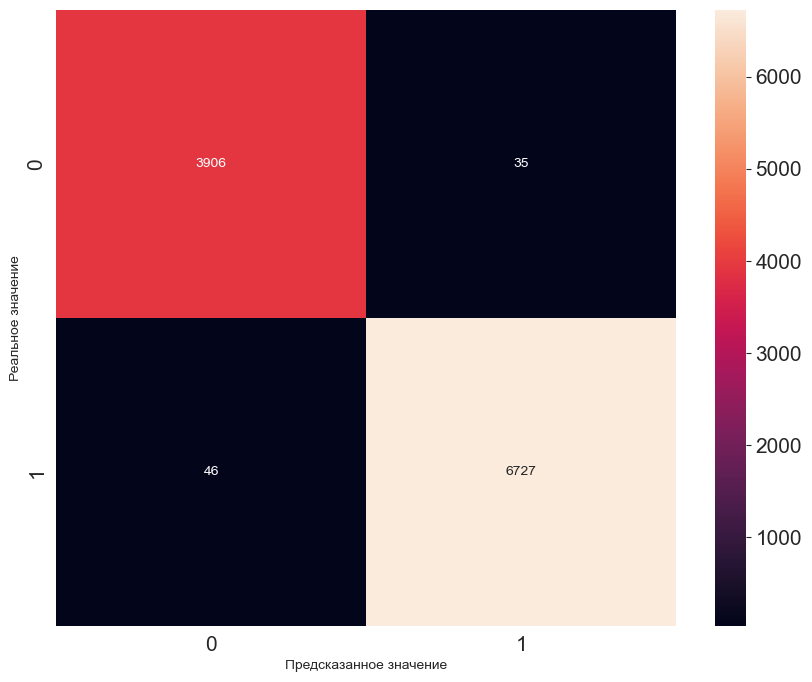

TEST


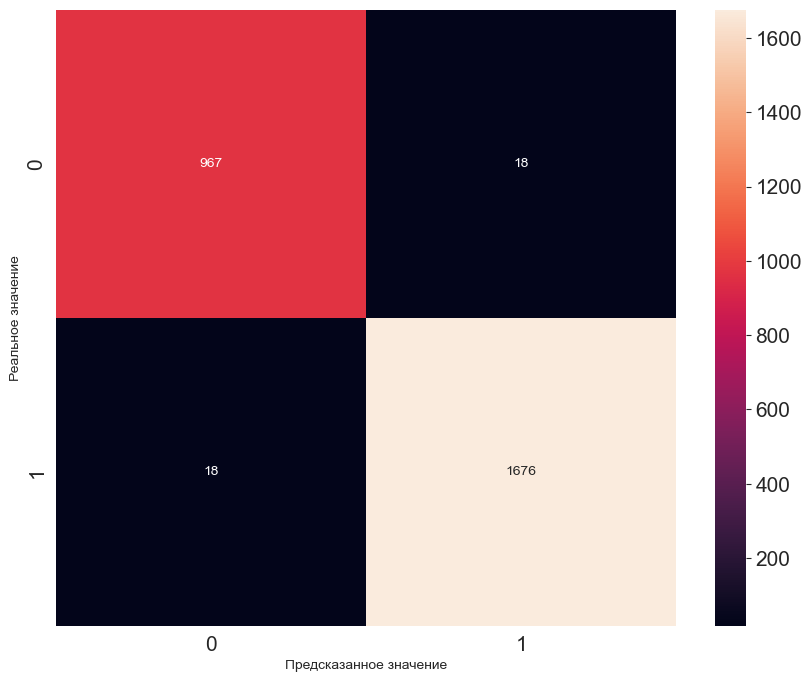

TEST:  Accuracy --  0.9924397983946238
TRAIN: Accuracy --  0.986562150055991
--------------------------------------------------
TEST:  F1 -- 0.9940155153306244
TRAIN: F1 -- 0.9893742621015348
--------------------------------------------------
TEST:  ROC_AUC -- 0.9921636662550263
TRAIN: ROC_AUC -- 0.9855500752132039
--------------------------------------------------

ROC_AUC TRAIN


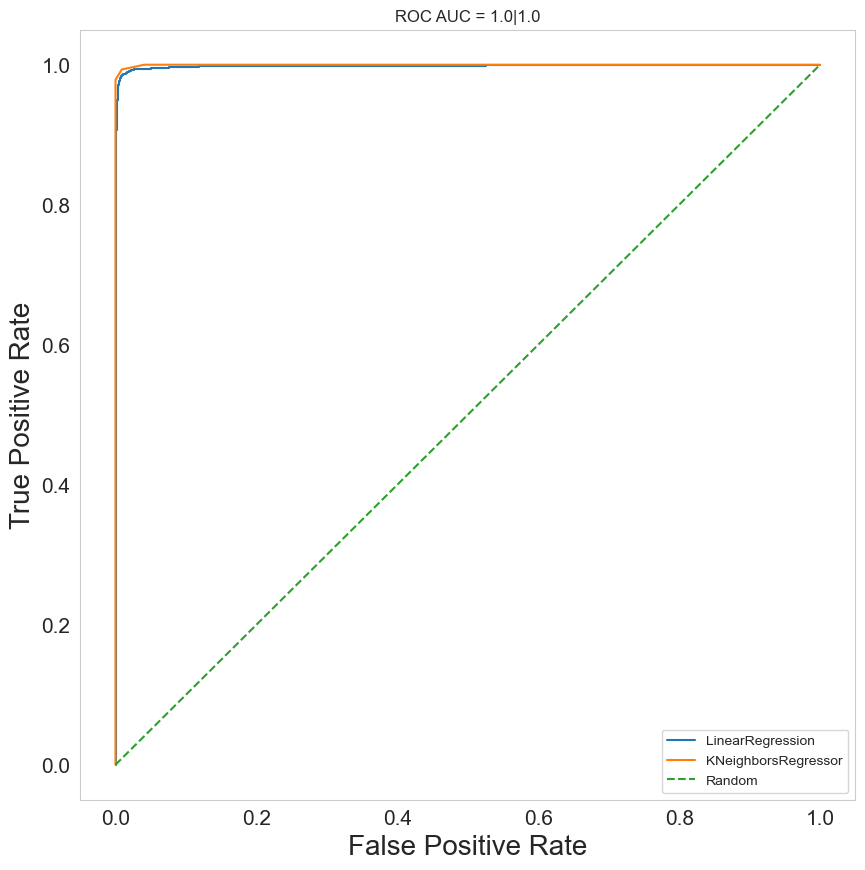

ROC_AUC TEST


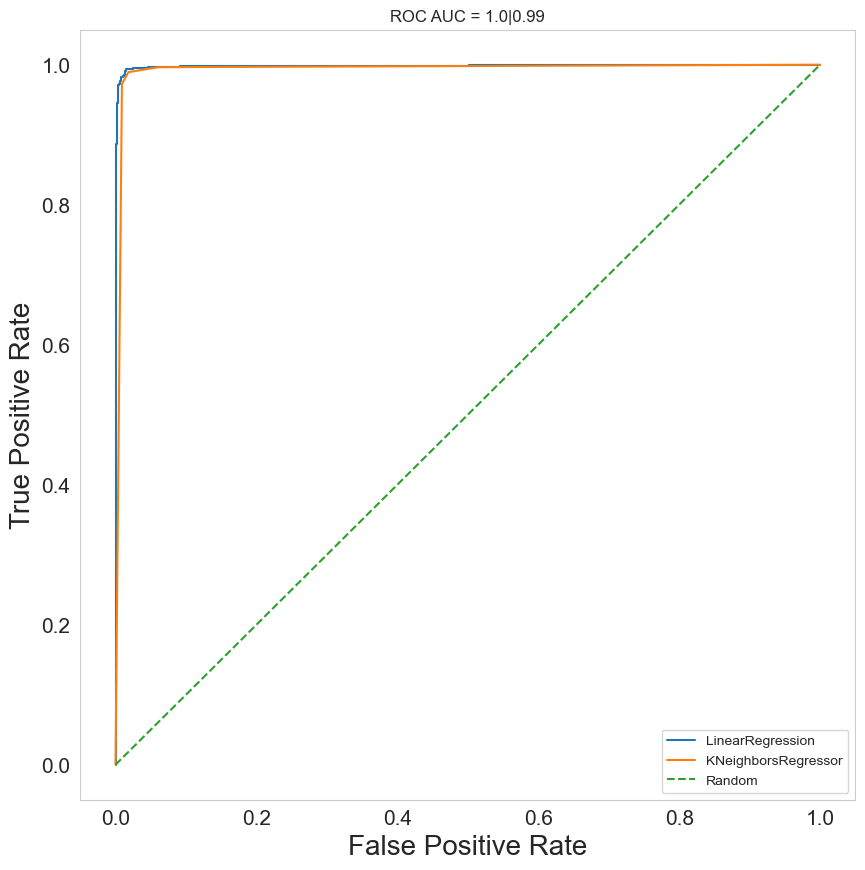

--------------------------------------------------


In [52]:
baseline(df, "gender", 3)

### Class

---

Теперь опробуем построить модель, которая будет предсказывать class физической формы.

Для этого определим метрики качества для задачи мультиклассификации.

Построем модель мультиклассовой классификации на основе линейного классификатора и сравните с KNN.

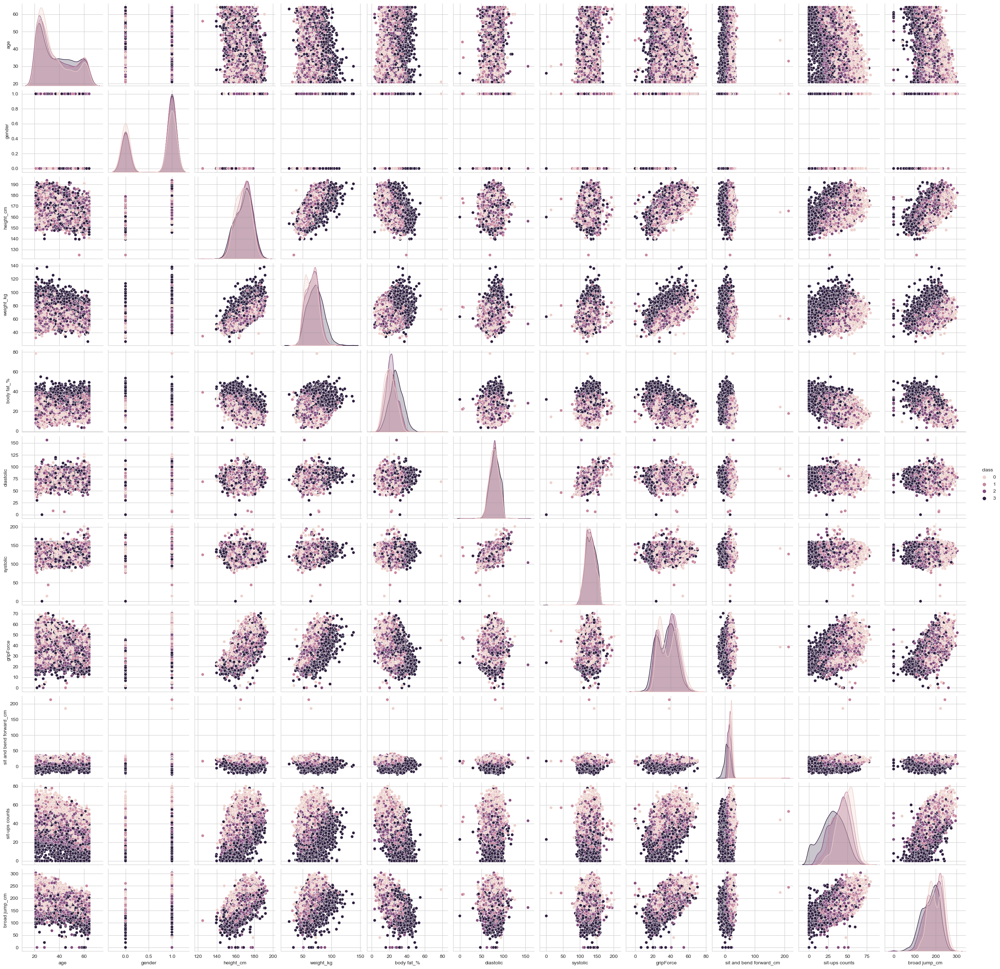

In [42]:
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)
sns.pairplot(df, hue="class")
plt.show()

Для определения класса, мы будем использовать метрики качества: MACRO PRECISION, MACRO RECALL и ROC_AUC (с различными стратегиями). На данный момент, это единственные метрики, которые я знаю для мультиклассовой классификации =)

LinearRegression
--------------------------------------------------
TRAIN


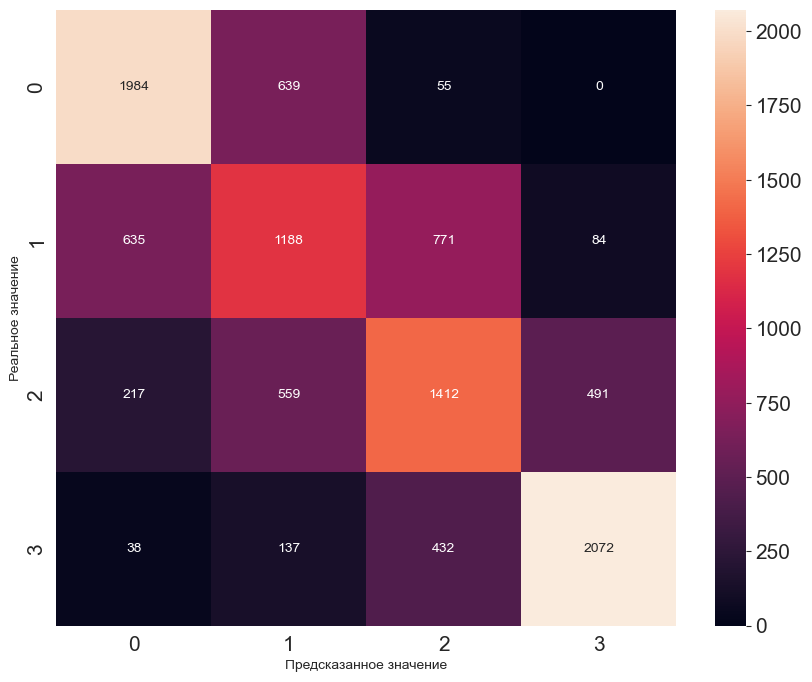

TEST


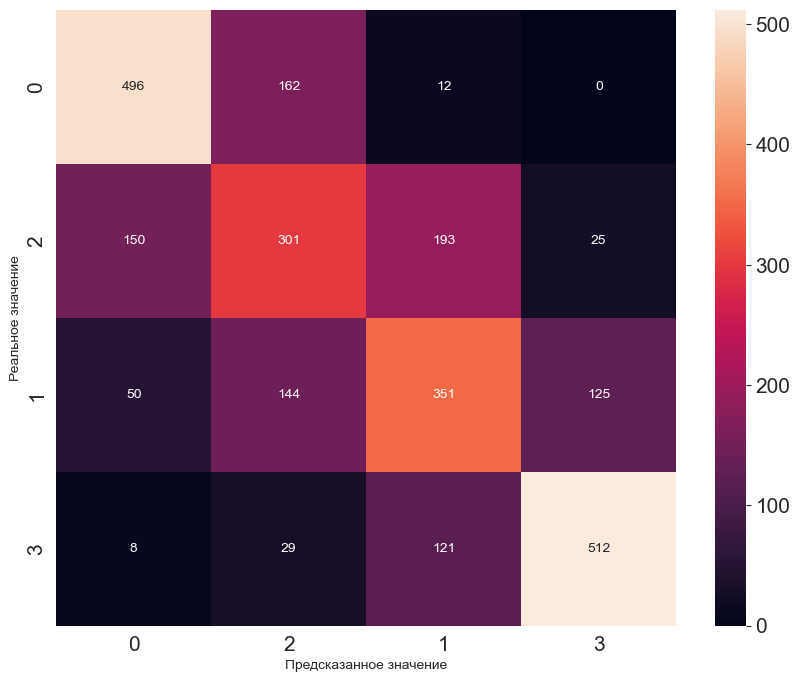

MACRO PRECISION:  0.6182017465937293
MICRO PRECISION:  0.6196341918626354
--------------------------------------------------
MACRO RECALL:  0.6212378187774745
MICRO RECALL:  0.6196341918626354
--------------------------------------------------
OvO: 0.853871908685952
OvR: 0.8568134899914814
--------------------------------------------------

KNeighborsRegressor
--------------------------------------------------
TRAIN


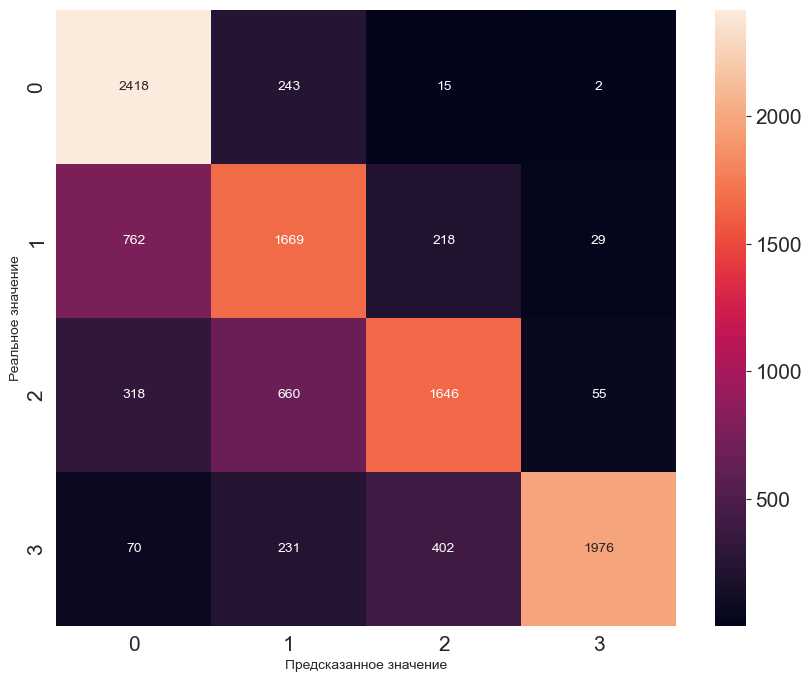

TEST


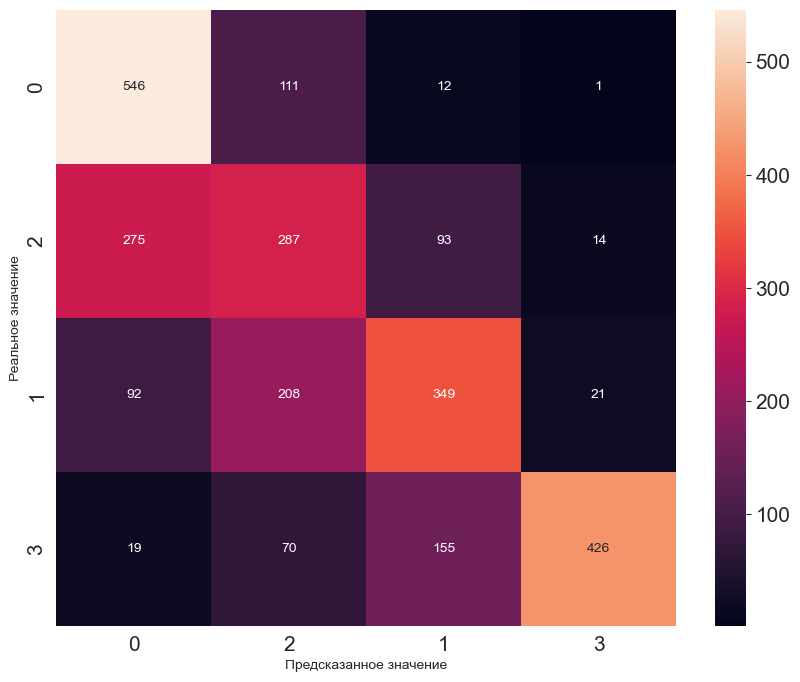

MACRO PRECISION:  0.7382575735221947
MICRO PRECISION:  0.6002239641657335
--------------------------------------------------
MACRO RECALL:  0.7195339808612946
MICRO RECALL:  0.6002239641657335
--------------------------------------------------
OvO: 0.9267342125201453
OvR: 0.8164627414388933
--------------------------------------------------


In [65]:
baseline(df, "class", 5)